# 第四章 基于SWAN和机器学习的波浪数值模型

## 4.3基于SWAN的计算参数研究

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math

from matplotlib.dates import DateFormatter

In [2]:
plt.rcParams['font.sans-serif'] = ['SimHei']  # 指定中文字体
plt.rcParams['axes.unicode_minus'] = False  

In [3]:
# 定义误差范围函数
def errFunction(err,length):
    x = np.linspace(0, length, 200)
    y = x
    error = err * y

    return x,y,error

# 定义RMSE函数
def rmseFunction(y,y_pred):
    rmse = math.sqrt(np.mean((y-y_pred)**2))
    return rmse


#定义R^2函数
def r2Function(y,y_pred):
    correlation_matrix  = np.corrcoef(y,y_pred)
    correlation_xy = correlation_matrix[0,1]

    r_squared = correlation_xy**2
    return r_squared

def maeFunction(y,y_pred):
    mae = np.mean(np.abs(y-y_pred))
    return mae

def biasFunction(y,y_pred):
    bias = np.mean(y-y_pred)
    return bias


# 定义数据对齐函数
def dataMatch(timeObserv, hsObserv, timeExpert, hsExpert):
    """
    对齐实测数据和实验数据，并返回对齐后的数据和时间数组。

    参数：
    timeObserv: 实测时间数组
    hsObserv: 实测数据数组
    timeExpert: 实验时间数组
    hsExpert: 实验数据数组

    返回值：
    matched_time: 对齐后的时间数组
    matched_hsObserv: 对齐后的实测数据数组
    matched_hsExpert: 对齐后的实验数据数组
    """

    matched_time = []
    matched_hsObserv = []
    matched_hsExpert = []
    for obs_time, obs_value in zip(timeObserv, hsObserv):
        exp_index = np.where(timeExpert == obs_time)[0]
        if len(exp_index) > 0:
            matched_time.append(obs_time)
            matched_hsObserv.append(obs_value)
            matched_hsExpert.append(hsExpert[exp_index[0]])

    matched_time = np.array(matched_time)
    matched_hsObserv = np.array(matched_hsObserv)
    matched_hsExpert = np.array(matched_hsExpert)

    return matched_time, matched_hsObserv, matched_hsExpert






### 迭代次数

#### 烟花——台州

In [4]:
data = pd.read_csv("dataFinal/Forth/data.csv",skiprows=1)

In [5]:
data

,时间1,实测,时间2,迭代次数1,迭代次数2,迭代次数3,迭代次数4,迭代次数5
0,2021/7/21 0:00,2.71364,2021/7/15 8:00,0.02078,0.020853,0.019742,0.020931,0.022666
1,2021/7/21 1:00,2.95662,2021/7/15 9:00,0.03564,0.034291,0.036374,0.035719,0.037441
2,2021/7/21 2:00,3.12016,2021/7/15 10:00,0.05545,0.057250,0.057078,0.055246,0.059526
3,2021/7/21 3:00,3.27902,2021/7/15 11:00,0.07560,0.077498,0.073553,0.072129,0.082384
4,2021/7/21 4:00,3.06408,2021/7/15 12:00,0.09607,0.096533,0.098532,0.096855,0.099864
...,...,...,...,...,...,...,...,...
403,NaN,NaN,2021/8/1 3:00,1.01735,1.060724,1.061081,1.052394,1.000026
404,NaN,NaN,2021/8/1 4:00,1.02351,0.982649,0.987314,1.025641,1.094258
405,NaN,NaN,2021/8/1 5:00,1.02603,1.024197,0.980246,1.033945,1.029005
406,NaN,NaN,2021/8/1 6:00,1.02646,1.016493,1.013111,0.978087,1.098005


In [6]:
data['时间1'] = pd.to_datetime(data['时间1'], format='%Y/%m/%d %H:%M')
data['时间2'] = pd.to_datetime(data['时间2'], format='%Y/%m/%d %H:%M')

In [7]:
timeObserv = data['时间1'][:160]
hsObserv = data['实测'][:160]

timeExpert= data['时间2']
hsExpert1 = data['迭代次数1']
hsExpert2 = data['迭代次数2']
hsExpert3 = data['迭代次数3']
hsExpert4 = data['迭代次数4']
hsExpert5 = data['迭代次数5']

In [8]:
matched_time00, matched_hsObserv00, matched_hsExpert00 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert1)
matched_time01, matched_hsObserv01, matched_hsExpert01 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert2)
matched_time02, matched_hsObserv02, matched_hsExpert02 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert3)
matched_time03, matched_hsObserv03, matched_hsExpert03 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert4)
matched_time04, matched_hsObserv04, matched_hsExpert04 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert5)



In [9]:
rmse00 = rmseFunction(matched_hsObserv00,matched_hsExpert00)
rmse01 = rmseFunction(matched_hsObserv01,matched_hsExpert01)
rmse02 = rmseFunction(matched_hsObserv02,matched_hsExpert02)
rmse03 = rmseFunction(matched_hsObserv03,matched_hsExpert03)
rmse04 = rmseFunction(matched_hsObserv04,matched_hsExpert04)

r200 = r2Function(matched_hsObserv00,matched_hsExpert00)
r201 = r2Function(matched_hsObserv01,matched_hsExpert01)
r202 = r2Function(matched_hsObserv02,matched_hsExpert02)
r203 = r2Function(matched_hsObserv03,matched_hsExpert03)
r204 = r2Function(matched_hsObserv04,matched_hsExpert04)

mae00 = maeFunction(matched_hsObserv00,matched_hsExpert00)
mae01 = maeFunction(matched_hsObserv01,matched_hsExpert01)
mae02 = maeFunction(matched_hsObserv02,matched_hsExpert02)
mae03 = maeFunction(matched_hsObserv03,matched_hsExpert03)
mae04 = maeFunction(matched_hsObserv04,matched_hsExpert04)

bias00 = biasFunction(matched_hsObserv00,matched_hsExpert00)
bias01 = biasFunction(matched_hsObserv01,matched_hsExpert01)
bias02 = biasFunction(matched_hsObserv02,matched_hsExpert02)
bias03 = biasFunction(matched_hsObserv03,matched_hsExpert03)
bias04 = biasFunction(matched_hsObserv04,matched_hsExpert04)


print(rmse00,rmse01,rmse02,rmse03,rmse04)
print(r200,r201,r202,r203,r204)
print(mae00,mae01,mae02,mae03,mae04)
print(bias00,bias01,bias02,bias03,bias04)

0.6046067507545791 0.6236987225573333 0.6231112181154205 0.628633876736142 0.6202038219195959
0.9073730394651931 0.900482491713894 0.9012200610075369 0.8994849974810483 0.9005774908174697
0.4677677634615384 0.4812089966346154 0.4818326286410257 0.4879577776602564 0.4839694060576923
0.08632277564102565 0.06998040569871791 0.0844144159230769 0.08474732539102561 -0.01751269408333332


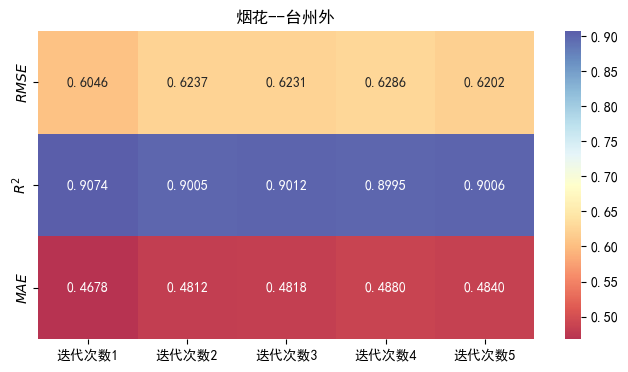

In [10]:
import seaborn as sns

# 将RMSE和R^2值存储在矩阵中
rmse_values = np.array([[rmse00, r200, mae00],
                        [rmse01, r201, mae01],
                        [rmse02, r202, mae02],
                        [rmse03, r203, mae03],
                        [rmse04, r204, mae04]]).T

# 创建热力图
plt.figure(figsize=(8, 4))
sns.heatmap(rmse_values, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", 
            yticklabels=['$RMSE$', '$R^2$', '$MAE$'], xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
# plt.xlabel('Metrics')
# plt.ylabel('Models')
plt.title('烟花--台州外')
plt.show()

In [13]:
x,y,err = errFunction(0.1,10)

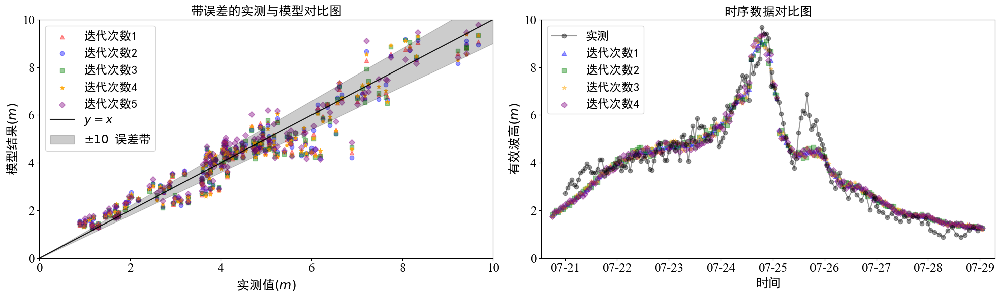

In [12]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv00, matched_hsExpert00, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv01, matched_hsExpert01, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv02, matched_hsExpert02, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv03, matched_hsExpert03, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv04, matched_hsExpert04, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv, hsObserv, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert[130:330], hsExpert1[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert[130:330], hsExpert2[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert[130:330], hsExpert3[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert[130:330], hsExpert4[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert[125],timeExpert[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


plt.tight_layout()
plt.savefig('图片/第四章/计算参数/烟花_台州.png',dpi=500)
plt.show()

#### 烟花--舟山

In [13]:
data2 = pd.read_csv("dataFinal/Forth/data2.csv",skiprows=1)

In [14]:
data2

,时间1,实测,时间2,迭代次数1,迭代次数2,迭代次数3,迭代次数4,迭代次数5,Unnamed: 8
0,2021/7/21 0:00,3.29643,2021/7/15 8:00,0.02967,0.029064,0.030299,0.028890,0.028350,NaN
1,2021/7/21 1:00,3.01964,2021/7/15 9:00,0.06241,0.059615,0.063290,0.064104,0.060426,NaN
2,2021/7/21 2:00,3.44618,2021/7/15 10:00,0.09555,0.097736,0.095467,0.097175,0.096441,NaN
3,2021/7/21 3:00,3.04686,2021/7/15 11:00,0.12248,0.116187,0.123252,0.116812,0.118725,NaN
4,2021/7/21 4:00,3.26921,2021/7/15 12:00,0.14412,0.138607,0.144046,0.138058,0.146838,NaN
...,...,...,...,...,...,...,...,...,...
403,NaN,NaN,2021/8/1 3:00,0.86947,0.796209,0.821415,0.780224,0.883238,NaN
404,NaN,NaN,2021/8/1 4:00,0.86108,0.833852,0.886473,0.831874,0.834108,NaN
405,NaN,NaN,2021/8/1 5:00,0.85552,0.818689,0.802990,0.849218,0.804670,NaN
406,NaN,NaN,2021/8/1 6:00,0.85431,0.771722,0.865410,0.875085,0.801526,NaN


In [15]:
data2['时间1'] = pd.to_datetime(data2['时间1'], format='%Y/%m/%d %H:%M')
data2['时间2'] = pd.to_datetime(data2['时间2'], format='%Y/%m/%d %H:%M')

In [16]:
data2['时间1'][:172]

0     2021-07-21 00:00:00
1     2021-07-21 01:00:00
2     2021-07-21 02:00:00
3     2021-07-21 03:00:00
4     2021-07-21 04:00:00
              ...        
167   2021-07-28 15:00:00
168   2021-07-28 17:00:00
169   2021-07-28 19:00:00
170   2021-07-28 21:00:00
171   2021-07-28 23:00:00
Name: 时间1, Length: 172, dtype: datetime64[ns]

In [17]:
timeObserv2 = data2['时间1'][:172]
hsObserv2 = data2['实测'][:172]

timeExpert2= data2['时间2']
hsExpert12 = data2['迭代次数1']
hsExpert22 = data2['迭代次数2']
hsExpert32 = data2['迭代次数3']
hsExpert42 = data2['迭代次数4']
hsExpert52 = data2['迭代次数5']

In [18]:
matched_time10, matched_hsObserv10, matched_hsExpert10 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert12)
matched_time11, matched_hsObserv11, matched_hsExpert11 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert22)
matched_time12, matched_hsObserv12, matched_hsExpert12 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert32)
matched_time13, matched_hsObserv13, matched_hsExpert13 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert42)
matched_time14, matched_hsObserv14, matched_hsExpert14 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert52)

In [19]:
rmse10 = rmseFunction(matched_hsObserv10,matched_hsExpert10)
rmse11 = rmseFunction(matched_hsObserv11,matched_hsExpert11)
rmse12 = rmseFunction(matched_hsObserv12,matched_hsExpert12)
rmse13 = rmseFunction(matched_hsObserv13,matched_hsExpert13)
rmse14 = rmseFunction(matched_hsObserv14,matched_hsExpert14)

r210 = r2Function(matched_hsObserv10,matched_hsExpert10)
r211 = r2Function(matched_hsObserv11,matched_hsExpert11)
r212 = r2Function(matched_hsObserv12,matched_hsExpert12)
r213 = r2Function(matched_hsObserv13,matched_hsExpert13)
r214 = r2Function(matched_hsObserv14,matched_hsExpert14)

mae10 = maeFunction(matched_hsObserv10,matched_hsExpert10)
mae11 = maeFunction(matched_hsObserv11,matched_hsExpert11)
mae12 = maeFunction(matched_hsObserv12,matched_hsExpert12)
mae13 = maeFunction(matched_hsObserv13,matched_hsExpert13)
mae14 = maeFunction(matched_hsObserv14,matched_hsExpert14)

bias10 = biasFunction(matched_hsObserv10,matched_hsExpert10)
bias11 = biasFunction(matched_hsObserv11,matched_hsExpert11)
bias12 = biasFunction(matched_hsObserv12,matched_hsExpert12)
bias13 = biasFunction(matched_hsObserv13,matched_hsExpert13)
bias14 = biasFunction(matched_hsObserv14,matched_hsExpert14)

print(rmse10,rmse11,rmse12,rmse13,rmse14)
print(r210,r211,r212,r213,r214)
print(mae10,mae11,mae12,mae13,mae14)
print(bias10,bias11,bias12,bias13,bias14)

0.504880389198858 0.5094132859043552 0.5255510440743205 0.55353800903423 0.519171958218818
0.9050980373774898 0.8967044731531664 0.8911127551034946 0.877711074885145 0.8958265128491808
0.3840965060240964 0.3854455392590362 0.38035527918072287 0.4234281155120482 0.37479069793373493
-0.11255650602409636 -0.0281180029698795 -0.0062684730361445675 -0.03558347506626506 -0.01805594025903611


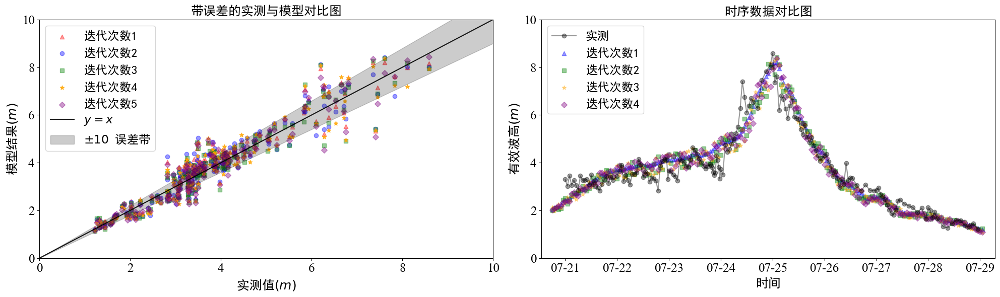

In [20]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv10, matched_hsExpert10, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv11, matched_hsExpert11, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv12, matched_hsExpert12, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv13, matched_hsExpert13, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv14, matched_hsExpert14, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)



plt.subplot(122) 
timeObserv2
plt.plot(timeObserv2, hsObserv2, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert2[130:330], hsExpert12[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert2[130:330], hsExpert22[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert2[130:330], hsExpert32[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert2[130:330], hsExpert42[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert2[125],timeExpert2[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/烟花_舟山.png',dpi=500)
plt.show()

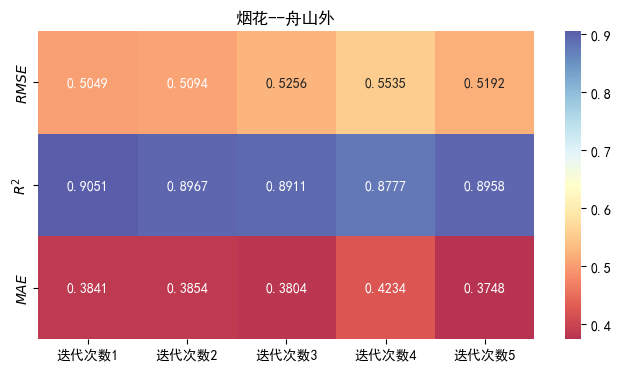

In [21]:
import seaborn as sns

# 将RMSE和R^2值存储在矩阵中
rmse_values = np.array([[rmse10, r210, mae10],
                        [rmse11, r211, mae11],
                        [rmse12, r212, mae12],
                        [rmse13, r213, mae13],
                        [rmse14, r214, mae14]]).T

# 创建热力图
plt.figure(figsize=(8, 4))
sns.heatmap(rmse_values, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", 
            yticklabels=['$RMSE$', '$R^2$', '$MAE$'], xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
# plt.xlabel('Metrics')
# plt.ylabel('Models')
plt.title('烟花--舟山外')
plt.show()

#### 灿鸿——温州

In [22]:
data3 = pd.read_csv("dataFinal/Forth/data3.csv",skiprows=1)

In [23]:
data3

,时间1,实测,时间2,迭代次数1,迭代次数2,迭代次数3,迭代次数4,迭代次数5
0,2021/7/8 1:00,1.70034,2021/7/7 1:00,1.305105,1.243426,1.233828,1.250253,1.284121
1,2021/7/8 2:00,1.84456,2021/7/7 2:00,1.384110,1.338291,1.318067,1.330783,1.385999
2,2021/7/8 3:00,2.04233,2021/7/7 3:00,1.461780,1.486299,1.546403,1.526321,1.486932
3,2021/7/8 4:00,2.21539,2021/7/7 4:00,1.537755,1.567094,1.604795,1.586514,1.548197
4,2021/7/8 5:00,2.58210,2021/7/7 5:00,1.609680,1.656507,1.617736,1.633145,1.695259
...,...,...,...,...,...,...,...,...
402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
data3['时间1'] = pd.to_datetime(data3['时间1'], format='%Y/%m/%d %H:%M')
data3['时间2'] = pd.to_datetime(data3['时间2'], format='%Y/%m/%d %H:%M')

In [25]:
data3['时间1'][:148]

0     2021-07-08 01:00:00
1     2021-07-08 02:00:00
2     2021-07-08 03:00:00
3     2021-07-08 04:00:00
4     2021-07-08 05:00:00
              ...        
143   2021-07-14 00:00:00
144   2021-07-14 01:00:00
145   2021-07-14 02:00:00
146   2021-07-14 03:00:00
147   2021-07-14 04:00:00
Name: 时间1, Length: 148, dtype: datetime64[ns]

In [26]:
timeObserv3 = data3['时间1'][:148]
hsObserv3 = data3['实测'][:148]

timeExpert3= data3['时间2'][:200]
hsExpert13 = data3['迭代次数1'][:200]
hsExpert23 = data3['迭代次数2'][:200]
hsExpert33 = data3['迭代次数3'][:200]
hsExpert43 = data3['迭代次数4'][:200]
hsExpert53 = data3['迭代次数5'][:200]

In [27]:
matched_time30, matched_hsObserv30, matched_hsExpert30 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert13)
matched_time31, matched_hsObserv31, matched_hsExpert31 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert23)
matched_time32, matched_hsObserv32, matched_hsExpert32 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert33)
matched_time33, matched_hsObserv33, matched_hsExpert33 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert43)
matched_time34, matched_hsObserv34, matched_hsExpert34 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert53)


In [28]:
rmse30 = rmseFunction(matched_hsObserv30,matched_hsExpert30)
rmse31 = rmseFunction(matched_hsObserv31,matched_hsExpert31)
rmse32 = rmseFunction(matched_hsObserv32,matched_hsExpert32)
rmse33 = rmseFunction(matched_hsObserv33,matched_hsExpert33)
rmse34 = rmseFunction(matched_hsObserv34,matched_hsExpert34)

r230 = r2Function(matched_hsObserv30,matched_hsExpert30)
r231 = r2Function(matched_hsObserv31,matched_hsExpert31)
r232 = r2Function(matched_hsObserv32,matched_hsExpert32)
r233 = r2Function(matched_hsObserv33,matched_hsExpert33)
r234 = r2Function(matched_hsObserv34,matched_hsExpert34)

mae30 = maeFunction(matched_hsObserv30,matched_hsExpert30)
mae31 = maeFunction(matched_hsObserv31,matched_hsExpert31)
mae32 = maeFunction(matched_hsObserv32,matched_hsExpert32)
mae33 = maeFunction(matched_hsObserv33,matched_hsExpert33)
mae34 = maeFunction(matched_hsObserv34,matched_hsExpert34)


bias30 = biasFunction(matched_hsObserv30,matched_hsExpert30)
bias31 = biasFunction(matched_hsObserv31,matched_hsExpert31)
bias32 = biasFunction(matched_hsObserv32,matched_hsExpert32)
bias33 = biasFunction(matched_hsObserv33,matched_hsExpert33)
bias34 = biasFunction(matched_hsObserv34,matched_hsExpert34)

print(rmse30,rmse31,rmse32,rmse33,rmse34)
print(r230,r231,r232,r233,r234)
print(mae30,mae31,mae32,mae33,mae34)
print(bias30,bias31,bias32,bias33,bias34)


0.7240323804352606 0.7266906868018154 0.7550297600224506 0.7309761329546968 0.7497578326779051
0.8783004389477869 0.8783448518220272 0.8768157929596793 0.8722719107648297 0.8774415810778295
0.6355765878378379 0.634707004945946 0.6552686659121622 0.6342145635337838 0.648640649945946
-0.20820983108108113 -0.20605633909459467 -0.25245380024999997 -0.17055960239864867 -0.24936585340540543


In [29]:
timeExpert3

0     2021-07-07 01:00:00
1     2021-07-07 02:00:00
2     2021-07-07 03:00:00
3     2021-07-07 04:00:00
4     2021-07-07 05:00:00
              ...        
195   2021-07-15 04:00:00
196   2021-07-15 05:00:00
197   2021-07-15 06:00:00
198   2021-07-15 07:00:00
199   2021-07-15 08:00:00
Name: 时间2, Length: 200, dtype: datetime64[ns]

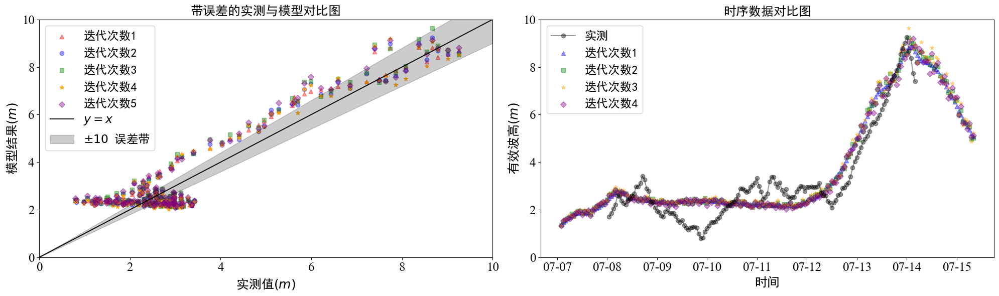

In [30]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv30, matched_hsExpert30, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv31, matched_hsExpert31, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv32, matched_hsExpert32, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv33, matched_hsExpert33, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv34, matched_hsExpert34, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv3, hsObserv3, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert3[1:], hsExpert13[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert3[1:], hsExpert23[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert3[1:], hsExpert33[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert3[1:], hsExpert43[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/灿鸿_温州.png',dpi=500)
plt.show()

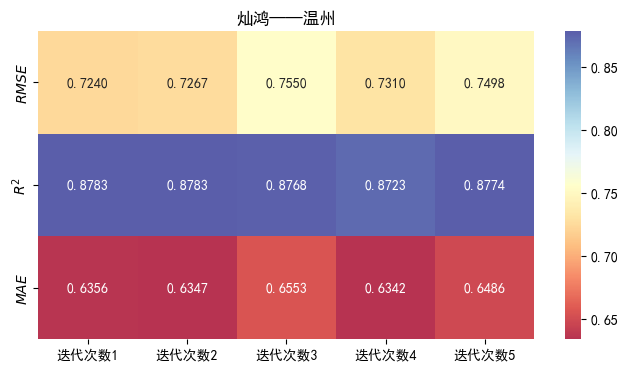

In [31]:
import seaborn as sns

# 将RMSE和R^2值存储在矩阵中
rmse_values = np.array([[rmse30, r230, mae30],
                        [rmse31, r231, mae31],
                        [rmse32, r232, mae32],
                        [rmse33, r233, mae33],
                        [rmse34, r234, mae34]]).T

# 创建热力图
plt.figure(figsize=(8, 4))
sns.heatmap(rmse_values, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", 
            yticklabels=['$RMSE$', '$R^2$', '$MAE$'], xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
# plt.xlabel('Metrics')
# plt.ylabel('Models')
plt.title('灿鸿——温州')
plt.show()

#### 灿鸿——舟山

In [32]:
data4 = pd.read_csv("dataFinal/Forth/data4.csv",skiprows=1)

In [33]:
data4['时间1'] = pd.to_datetime(data4['时间1'], format='%Y/%m/%d %H:%M')
data4['时间2'] = pd.to_datetime(data4['时间2'], format='%Y/%m/%d %H:%M')

In [34]:
data4['时间1'][:113],data4['时间2'][:179]

(0     2021-07-09 01:00:00
 1     2021-07-09 02:00:00
 2     2021-07-09 03:00:00
 3     2021-07-09 04:00:00
 4     2021-07-09 05:00:00
               ...        
 108   2021-07-13 13:00:00
 109   2021-07-13 14:00:00
 110   2021-07-13 15:00:00
 111   2021-07-13 16:00:00
 112   2021-07-13 17:00:00
 Name: 时间1, Length: 113, dtype: datetime64[ns],
 0     2021-07-09 05:00:00
 1     2021-07-09 06:00:00
 2     2021-07-09 07:00:00
 3     2021-07-09 08:00:00
 4     2021-07-09 09:00:00
               ...        
 174   2021-07-16 11:00:00
 175   2021-07-16 12:00:00
 176   2021-07-16 13:00:00
 177   2021-07-16 14:00:00
 178   2021-07-16 15:00:00
 Name: 时间2, Length: 179, dtype: datetime64[ns])

In [35]:
timeObserv4 = data4['时间1'][:113]
hsObserv4 = data4['实测'][:113]

timeExpert4= data4['时间2'][:179]
hsExpert14 = data4['迭代次数1'][:179]
hsExpert24 = data4['迭代次数2'][:179]
hsExpert34 = data4['迭代次数3'][:179]
hsExpert44 = data4['迭代次数4'][:179]
hsExpert54 = data4['迭代次数5'][:179]

In [36]:
matched_time40, matched_hsObserv40, matched_hsExpert40 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert14)
matched_time41, matched_hsObserv41, matched_hsExpert41 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert24)
matched_time42, matched_hsObserv42, matched_hsExpert42 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert34)
matched_time43, matched_hsObserv43, matched_hsExpert43 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert44)
matched_time44, matched_hsObserv44, matched_hsExpert44 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert54)


In [37]:
rmse40 = rmseFunction(matched_hsObserv40,matched_hsExpert40)
rmse41 = rmseFunction(matched_hsObserv41,matched_hsExpert41)
rmse42 = rmseFunction(matched_hsObserv42,matched_hsExpert42)
rmse43 = rmseFunction(matched_hsObserv43,matched_hsExpert43)
rmse44 = rmseFunction(matched_hsObserv44,matched_hsExpert44)

r240 = r2Function(matched_hsObserv40,matched_hsExpert40)
r241 = r2Function(matched_hsObserv41,matched_hsExpert41)
r242 = r2Function(matched_hsObserv42,matched_hsExpert42)
r243 = r2Function(matched_hsObserv43,matched_hsExpert43)
r244 = r2Function(matched_hsObserv44,matched_hsExpert44)

mae40 = maeFunction(matched_hsObserv40,matched_hsExpert40)
mae41 = maeFunction(matched_hsObserv41,matched_hsExpert41)
mae42 = maeFunction(matched_hsObserv42,matched_hsExpert42)
mae43 = maeFunction(matched_hsObserv43,matched_hsExpert43)
mae44 = maeFunction(matched_hsObserv44,matched_hsExpert44)

bias40 = biasFunction(matched_hsObserv40,matched_hsExpert40)
bias41 = biasFunction(matched_hsObserv41,matched_hsExpert41)
bias42 = biasFunction(matched_hsObserv42,matched_hsExpert42)
bias43 = biasFunction(matched_hsObserv43,matched_hsExpert43)
bias44 = biasFunction(matched_hsObserv44,matched_hsExpert44)



print(rmse40,rmse41,rmse42,rmse43,rmse44)
print(r240,r241,r242,r243,r244)
print(mae40,mae41,mae42,mae43,mae44)
print(bias40,bias41,bias42,bias43,bias44)

0.614144255919486 0.6279349301286246 0.6221354574411113 0.6358985108352787 0.6284879461780493
0.9580090773794291 0.9569555158245538 0.9570683401339094 0.9559041617626476 0.9556063823323115
0.48855357798165155 0.49542787215596334 0.49753400274311926 0.502119815972477 0.4987320744311927
0.18986568807339443 0.21110193257798163 0.19275717964220182 0.21148789171559632 0.182354903678899


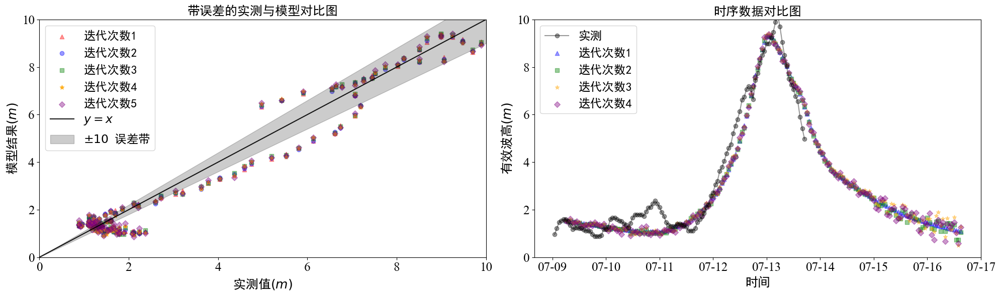

In [38]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv40, matched_hsExpert40, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv41, matched_hsExpert41, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv42, matched_hsExpert42, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv43, matched_hsExpert43, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv44, matched_hsExpert44, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

plt.subplot(122) 

plt.plot(timeObserv4, hsObserv4, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert4[1:], hsExpert14[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert4[1:], hsExpert24[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert4[1:], hsExpert34[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert4[1:], hsExpert44[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/灿鸿_舟山.png',dpi=500)
plt.show()

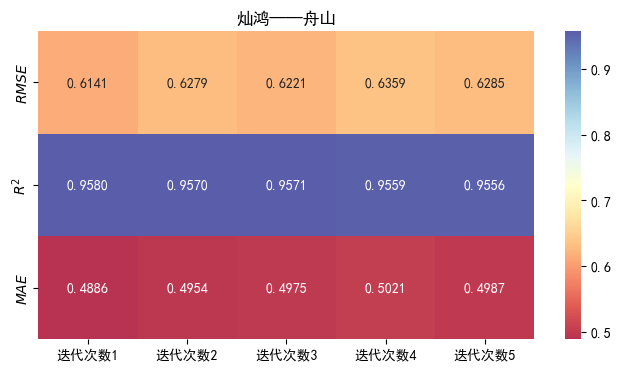

In [39]:
import seaborn as sns

# 将RMSE和R^2值存储在矩阵中
rmse_values = np.array([[rmse40, r240, mae40],
                        [rmse41, r241, mae41],
                        [rmse42, r242, mae42],
                        [rmse43, r243, mae43],
                        [rmse44, r244, mae44]]).T

# 创建热力图
plt.figure(figsize=(8, 4))
sns.heatmap(rmse_values, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", 
            yticklabels=['$RMSE$', '$R^2$', '$MAE$'], xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
# plt.xlabel('Metrics')
# plt.ylabel('Models')
plt.title('灿鸿——舟山')
plt.show()

#### 利奇马——温州


In [40]:
data5 = pd.read_csv("dataFinal/Forth/data5.csv",skiprows=1)

In [41]:
data5['时间1'] = pd.to_datetime(data5['时间1'], format='%Y/%m/%d %H:%M')
data5['时间2'] = pd.to_datetime(data5['时间2'], format='%Y/%m/%d %H:%M')

In [42]:
data5['时间1'][:161],data5['时间2'][:215]

(0     2021-08-07 01:00:00
 1     2021-08-07 02:00:00
 2     2021-08-07 03:00:00
 3     2021-08-07 04:00:00
 4     2021-08-07 05:00:00
               ...        
 156   2021-08-13 13:00:00
 157   2021-08-13 14:00:00
 158   2021-08-13 15:00:00
 159   2021-08-13 16:00:00
 160   2021-08-13 17:00:00
 Name: 时间1, Length: 161, dtype: datetime64[ns],
 0     2021-08-07 01:00:00
 1     2021-08-07 02:00:00
 2     2021-08-07 03:00:00
 3     2021-08-07 04:00:00
 4     2021-08-07 05:00:00
               ...        
 210   2021-08-15 19:00:00
 211   2021-08-15 20:00:00
 212   2021-08-15 21:00:00
 213   2021-08-15 22:00:00
 214   2021-08-15 23:00:00
 Name: 时间2, Length: 215, dtype: datetime64[ns])

In [43]:
timeObserv5 = data5['时间1'][:161]
hsObserv5 = data5['实测'][:161]

timeExpert5= data5['时间2'][:215]
hsExpert15 = data5['迭代次数1'][:215]
hsExpert25 = data5['迭代次数2'][:215]
hsExpert35 = data5['迭代次数3'][:215]
hsExpert45 = data5['迭代次数4'][:215]
hsExpert55 = data5['迭代次数5'][:215]

In [44]:
matched_time50, matched_hsObserv50, matched_hsExpert50 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert15)
matched_time51, matched_hsObserv51, matched_hsExpert51 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert25)
matched_time52, matched_hsObserv52, matched_hsExpert52 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert35)
matched_time53, matched_hsObserv53, matched_hsExpert53 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert45)
matched_time54, matched_hsObserv54, matched_hsExpert54 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert55)


In [45]:
rmse50 = rmseFunction(matched_hsObserv50,matched_hsExpert50)
rmse51 = rmseFunction(matched_hsObserv51,matched_hsExpert51)
rmse52 = rmseFunction(matched_hsObserv52,matched_hsExpert52)
rmse53 = rmseFunction(matched_hsObserv53,matched_hsExpert53)
rmse54 = rmseFunction(matched_hsObserv54,matched_hsExpert54)

r250 = r2Function(matched_hsObserv50,matched_hsExpert50)
r251 = r2Function(matched_hsObserv51,matched_hsExpert51)
r252 = r2Function(matched_hsObserv52,matched_hsExpert52)
r253 = r2Function(matched_hsObserv53,matched_hsExpert53)
r254 = r2Function(matched_hsObserv54,matched_hsExpert54)

mae50 = maeFunction(matched_hsObserv50,matched_hsExpert50)
mae51 = maeFunction(matched_hsObserv51,matched_hsExpert51)
mae52 = maeFunction(matched_hsObserv52,matched_hsExpert52)
mae53 = maeFunction(matched_hsObserv53,matched_hsExpert53)
mae54 = maeFunction(matched_hsObserv54,matched_hsExpert54)

bias50 = biasFunction(matched_hsObserv50,matched_hsExpert50)
bias51 = biasFunction(matched_hsObserv51,matched_hsExpert51)
bias52 = biasFunction(matched_hsObserv52,matched_hsExpert52)
bias53 = biasFunction(matched_hsObserv53,matched_hsExpert53)
bias54 = biasFunction(matched_hsObserv54,matched_hsExpert54)


print(rmse50,rmse51,rmse52,rmse53,rmse54)
print(r250,r251,r252,r253,r254)
print(mae50,mae51,mae52,mae53,mae54)
print(bias50,bias51,bias52,bias53,bias54)


0.3684638895589606 0.3670604163223868 0.7369277790248789 0.7428991022541143 0.7428991022541143
0.9605427256223448 0.9599179128576757 0.8554508595884824 0.8547705318326971 0.8547705318326971
0.2616903934968944 0.25566130741614906 0.5233807869813665 0.5239569254658385 0.5239569254658385
-0.0850163802795031 -0.05569634478260871 -0.1700327605217391 -0.18856791925465835 -0.18856791925465835


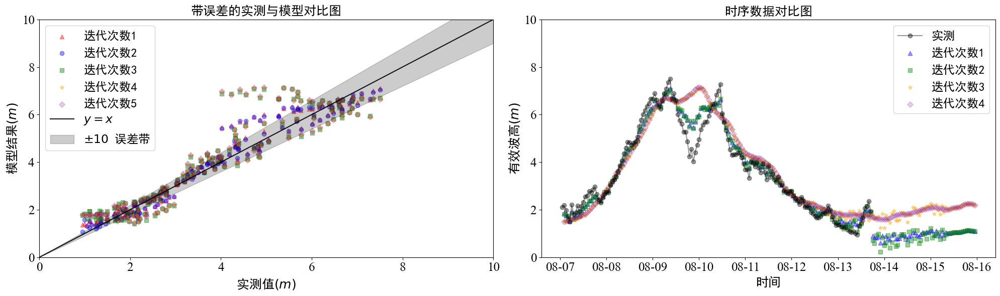

In [46]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv50, matched_hsExpert50, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv51, matched_hsExpert51, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv52, matched_hsExpert52, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv53, matched_hsExpert53, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv54, matched_hsExpert54, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv5, hsObserv5, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert5[1:], hsExpert15[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert5[1:], hsExpert25[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert5[1:], hsExpert35[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert5[1:], hsExpert45[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper right')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/利奇马_温州.png',dpi=500)
plt.show()



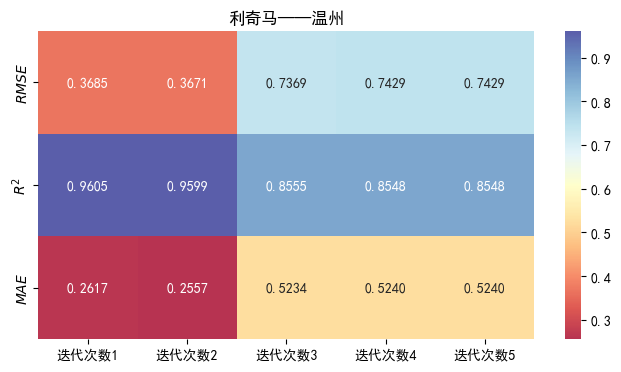

In [47]:
import seaborn as sns

# 将RMSE和R^2值存储在矩阵中
rmse_values = np.array([[rmse50, r250, mae50],
                        [rmse51, r251, mae51],
                        [rmse52, r252, mae52],
                        [rmse53, r253, mae53],
                        [rmse54, r254, mae54]]).T

# 创建热力图
plt.figure(figsize=(8, 4))
sns.heatmap(rmse_values, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", 
            yticklabels=['$RMSE$', '$R^2$', '$MAE$'], xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
# plt.xlabel('Metrics')
# plt.ylabel('Models')
plt.title('利奇马——温州')
plt.show()

#### 利奇马——舟山

In [48]:
data6 = pd.read_csv("dataFinal/Forth/data6.csv",skiprows=1)

In [49]:
data6['时间1'] = pd.to_datetime(data6['时间1'], format='%Y/%m/%d %H:%M')
data6['时间2'] = pd.to_datetime(data6['时间2'], format='%Y/%m/%d %H:%M')

In [50]:
data6['时间1'][:80],data6['时间2'][:215]

(0    2021-08-07 05:00:00
 1    2021-08-07 06:00:00
 2    2021-08-07 07:00:00
 3    2021-08-07 08:00:00
 4    2021-08-07 09:00:00
              ...        
 75   2021-08-10 08:00:00
 76   2021-08-10 09:00:00
 77   2021-08-10 10:00:00
 78   2021-08-10 11:00:00
 79   2021-08-10 12:00:00
 Name: 时间1, Length: 80, dtype: datetime64[ns],
 0     2021-08-07 01:00:00
 1     2021-08-07 02:00:00
 2     2021-08-07 03:00:00
 3     2021-08-07 04:00:00
 4     2021-08-07 05:00:00
               ...        
 210   2021-08-15 19:00:00
 211   2021-08-15 20:00:00
 212   2021-08-15 21:00:00
 213   2021-08-15 22:00:00
 214   2021-08-15 23:00:00
 Name: 时间2, Length: 215, dtype: datetime64[ns])

In [51]:
timeObserv6 = data6['时间1'][:80]
hsObserv6 = data6['实测'][:80]

timeExpert6= data6['时间2'][:215]
hsExpert16 = data6['迭代次数1'][:215]
hsExpert26 = data6['迭代次数2'][:215]
hsExpert36 = data6['迭代次数3'][:215]
hsExpert46 = data6['迭代次数4'][:215]
hsExpert56 = data6['迭代次数5'][:215]

In [52]:
matched_time60, matched_hsObserv60, matched_hsExpert60 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert16)
matched_time61, matched_hsObserv61, matched_hsExpert61 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert26)
matched_time62, matched_hsObserv62, matched_hsExpert62 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert36)
matched_time63, matched_hsObserv63, matched_hsExpert63 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert46)
matched_time64, matched_hsObserv64, matched_hsExpert64 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert56)


In [53]:
rmse60 = rmseFunction(matched_hsObserv60,matched_hsExpert60)
rmse61 = rmseFunction(matched_hsObserv61,matched_hsExpert61)
rmse62 = rmseFunction(matched_hsObserv62,matched_hsExpert62)
rmse63 = rmseFunction(matched_hsObserv63,matched_hsExpert63)
rmse64 = rmseFunction(matched_hsObserv64,matched_hsExpert64)

r260 = r2Function(matched_hsObserv60,matched_hsExpert60)
r261 = r2Function(matched_hsObserv61,matched_hsExpert61)
r262 = r2Function(matched_hsObserv62,matched_hsExpert62)
r263 = r2Function(matched_hsObserv63,matched_hsExpert63)
r264 = r2Function(matched_hsObserv64,matched_hsExpert64)

mae60 = maeFunction(matched_hsObserv60,matched_hsExpert60)
mae61 = maeFunction(matched_hsObserv61,matched_hsExpert61)
mae62 = maeFunction(matched_hsObserv62,matched_hsExpert62)
mae63 = maeFunction(matched_hsObserv63,matched_hsExpert63)
mae64 = maeFunction(matched_hsObserv64,matched_hsExpert64)

bias60 = biasFunction(matched_hsObserv60,matched_hsExpert60)
bias61 = biasFunction(matched_hsObserv61,matched_hsExpert61)
bias62 = biasFunction(matched_hsObserv62,matched_hsExpert62)
bias63 = biasFunction(matched_hsObserv63,matched_hsExpert63)
bias64 = biasFunction(matched_hsObserv64,matched_hsExpert64)

print(rmse60,rmse61,rmse62,rmse63,rmse64)
print(r260,r261,r262,r263,r264)
print(mae60,mae61,mae62,mae63,mae64)
print(bias60,bias61,bias62,bias63,bias64)


0.6745087869535134 0.6710450198070891 0.6663366147427089 0.6798082225594773 0.6737769178489846
0.9077480683853928 0.906809586735677 0.9071817731256141 0.9043383732324051 0.9100525193475739
0.5314755000000001 0.5418267848625 0.5332353210625 0.5405268701000001 0.5236100405
-0.17115975 -0.14201112388749998 -0.14316983561250002 -0.150796471075 -0.191523028925


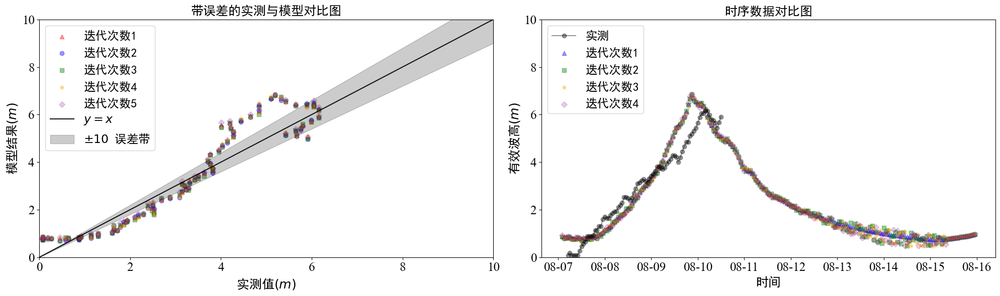

In [54]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv60, matched_hsExpert60, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv61, matched_hsExpert61, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv62, matched_hsExpert62, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv63, matched_hsExpert63, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv64, matched_hsExpert64, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv6, hsObserv6, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert6[1:], hsExpert16[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert6[1:], hsExpert26[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert6[1:], hsExpert36[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert6[1:], hsExpert46[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/利奇马_舟山.png',dpi=500)
plt.show()


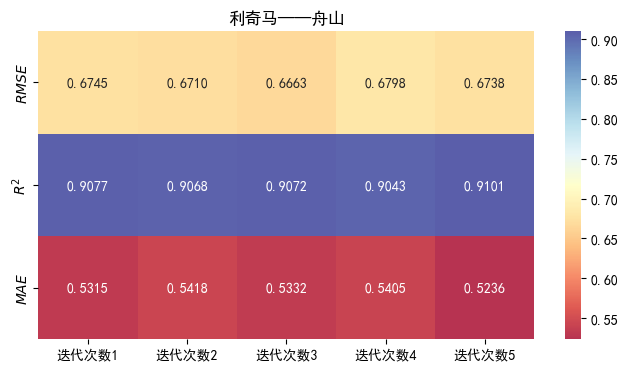

In [55]:
import seaborn as sns

# 将RMSE和R^2值存储在矩阵中
rmse_values = np.array([[rmse60, r260, mae60],
                        [rmse61, r261, mae61],
                        [rmse62, r262, mae62],
                        [rmse63, r263, mae63],
                        [rmse64, r264, mae64]]).T

# 创建热力图
plt.figure(figsize=(8, 4))
sns.heatmap(rmse_values, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", 
            yticklabels=['$RMSE$', '$R^2$', '$MAE$'], xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
# plt.xlabel('Metrics')
# plt.ylabel('Models')
plt.title('利奇马——舟山')
plt.show()

#### RMSE矩阵


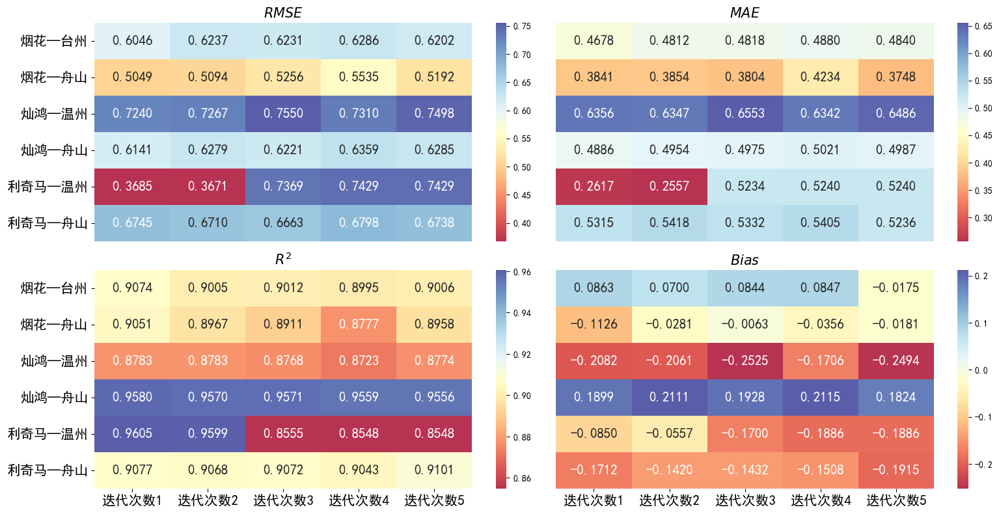

In [56]:
import seaborn as sns

rmse_iter = np.array([[rmse00,rmse10,rmse30,rmse40,rmse50,rmse60],
                     [rmse01,rmse11,rmse31,rmse41,rmse51,rmse61],
                     [rmse02,rmse12,rmse32,rmse42,rmse52,rmse62],
                     [rmse03,rmse13,rmse33,rmse43,rmse53,rmse63],
                     [rmse04,rmse14,rmse34,rmse44,rmse54,rmse64]]).T

mae_iter = np.array([[mae00,mae10,mae30,mae40,mae50,mae60],
                     [mae01,mae11,mae31,mae41,mae51,mae61],
                     [mae02,mae12,mae32,mae42,mae52,mae62],
                     [mae03,mae13,mae33,mae43,mae53,mae63],
                     [mae04,mae14,mae34,mae44,mae54,mae64]]).T

r2_iter = np.array([[r200,r210,r230,r240,r250,r260],
                     [r201,r211,r231,r241,r251,r261],
                     [r202,r212,r232,r242,r252,r262],
                     [r203,r213,r233,r243,r253,r263],
                     [r204,r214,r234,r244,r254,r264]]).T

bias_iter = np.array([[bias00,bias10,bias30,bias40,bias50,bias60],
                        [bias01,bias11,bias31,bias41,bias51,bias61],
                        [bias02,bias12,bias32,bias42,bias52,bias62],
                        [bias03,bias13,bias33,bias43,bias53,bias63],
                        [bias04,bias14,bias34,bias44,bias54,bias64]]).T


annot_font = {'size': 15}

plt.figure(figsize=(16, 8))


plt.subplot(221)
sns.heatmap(rmse_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'],
            xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])



plt.yticks(fontsize=15)  
plt.xticks([],fontsize=15)


plt.title('$RMSE$',size=15)


plt.subplot(222)
sns.heatmap(mae_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'],
            xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
plt.yticks([],fontsize=15)  
plt.xticks([],fontsize=15)
plt.title('$MAE$',size=15)


plt.subplot(223)
sns.heatmap(r2_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'], 
            xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])

plt.yticks(fontsize=15)  
plt.xticks(fontsize=15)

plt.title('$R^2$',size=15)

plt.subplot(224)
sns.heatmap(bias_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'], 
            xticklabels=['迭代次数1', '迭代次数2', '迭代次数3', '迭代次数4', '迭代次数5'])
plt.yticks([],fontsize=15)  
plt.xticks(fontsize=15)
plt.title('$Bias$',size=15)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/迭代次数的指标.png',dpi=500)
plt.show()


#### 迭代次数——总

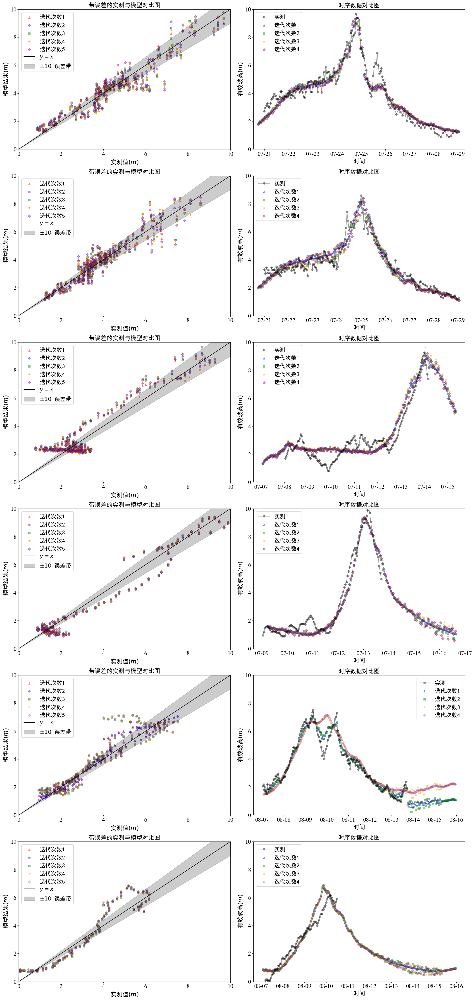

In [57]:
plt.figure(figsize=(20, 42))


plt.subplot(621) 
plt.scatter(matched_hsObserv00, matched_hsExpert00, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv01, matched_hsExpert01, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv02, matched_hsExpert02, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv03, matched_hsExpert03, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv04, matched_hsExpert04, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(622) 

plt.plot(timeObserv, hsObserv, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert[130:330], hsExpert1[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert[130:330], hsExpert2[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert[130:330], hsExpert3[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert[130:330], hsExpert4[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert[125],timeExpert[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)



plt.subplot(623) 
plt.scatter(matched_hsObserv10, matched_hsExpert10, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv11, matched_hsExpert11, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv12, matched_hsExpert12, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv13, matched_hsExpert13, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv14, matched_hsExpert14, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)



plt.subplot(624) 
timeObserv2
plt.plot(timeObserv2, hsObserv2, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert2[130:330], hsExpert12[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert2[130:330], hsExpert22[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert2[130:330], hsExpert32[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert2[130:330], hsExpert42[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert2[125],timeExpert2[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


## 灿鸿  温州

plt.subplot(625) 
plt.scatter(matched_hsObserv30, matched_hsExpert30, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv31, matched_hsExpert31, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv32, matched_hsExpert32, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv33, matched_hsExpert33, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv34, matched_hsExpert34, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(626) 

plt.plot(timeObserv3, hsObserv3, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert3[1:], hsExpert13[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert3[1:], hsExpert23[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert3[1:], hsExpert33[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert3[1:], hsExpert43[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

## 灿鸿  舟山


plt.subplot(627) 
plt.scatter(matched_hsObserv40, matched_hsExpert40, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv41, matched_hsExpert41, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv42, matched_hsExpert42, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv43, matched_hsExpert43, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv44, matched_hsExpert44, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

plt.subplot(628) 

plt.plot(timeObserv4, hsObserv4, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert4[1:], hsExpert14[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert4[1:], hsExpert24[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert4[1:], hsExpert34[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert4[1:], hsExpert44[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


## 利奇马   温州


plt.subplot(629) 
plt.scatter(matched_hsObserv50, matched_hsExpert50, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv51, matched_hsExpert51, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv52, matched_hsExpert52, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv53, matched_hsExpert53, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv54, matched_hsExpert54, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(6, 2, 10)

plt.plot(timeObserv5, hsObserv5, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert5[1:], hsExpert15[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert5[1:], hsExpert25[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert5[1:], hsExpert35[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert5[1:], hsExpert45[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper right')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


## 利奇马  舟山

plt.subplot(6,2,11) 
plt.scatter(matched_hsObserv60, matched_hsExpert60, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv61, matched_hsExpert61, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv62, matched_hsExpert62, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv63, matched_hsExpert63, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv64, matched_hsExpert64, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(6,2,12) 

plt.plot(timeObserv6, hsObserv6, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert6[1:], hsExpert16[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert6[1:], hsExpert26[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert6[1:], hsExpert36[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert6[1:], hsExpert46[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)






plt.tight_layout()
# plt.savefig('图片/第四章/计算参数/迭代次数.png',dpi=500)
plt.show()


#### 迭代次数：烟花

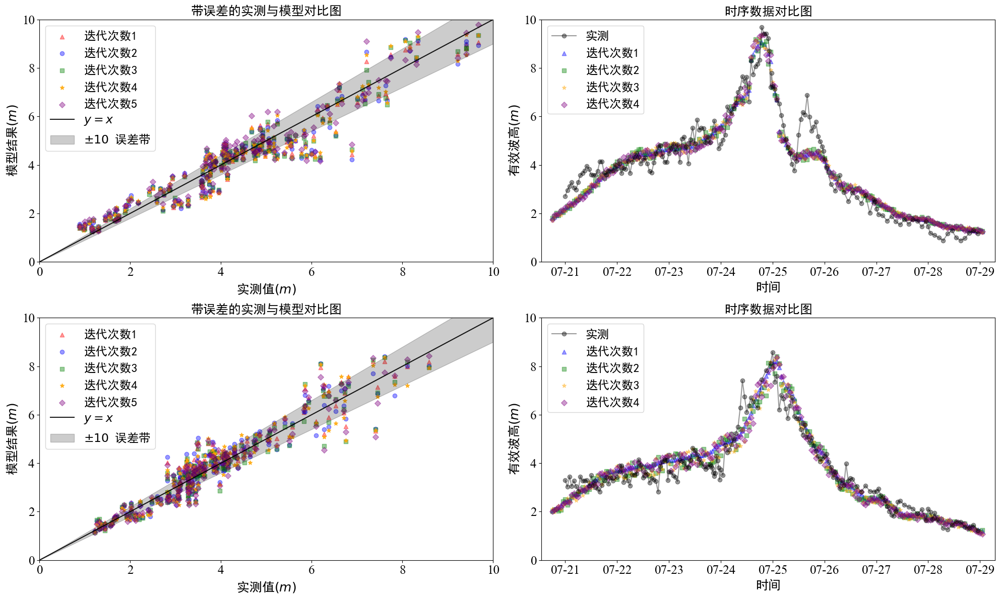

In [58]:
plt.figure(figsize=(20, 12))


plt.subplot(221) 
plt.scatter(matched_hsObserv00, matched_hsExpert00, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv01, matched_hsExpert01, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv02, matched_hsExpert02, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv03, matched_hsExpert03, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv04, matched_hsExpert04, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(222) 

plt.plot(timeObserv, hsObserv, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert[130:330], hsExpert1[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert[130:330], hsExpert2[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert[130:330], hsExpert3[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert[130:330], hsExpert4[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert[125],timeExpert[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)



plt.subplot(223) 
plt.scatter(matched_hsObserv10, matched_hsExpert10, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv11, matched_hsExpert11, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv12, matched_hsExpert12, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv13, matched_hsExpert13, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv14, matched_hsExpert14, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)



plt.subplot(224) 
timeObserv2
plt.plot(timeObserv2, hsObserv2, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert2[130:330], hsExpert12[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert2[130:330], hsExpert22[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert2[130:330], hsExpert32[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert2[130:330], hsExpert42[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert2[125],timeExpert2[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/迭代次数_烟花.png',dpi=500)
plt.show()


#### 迭代次数：灿鸿

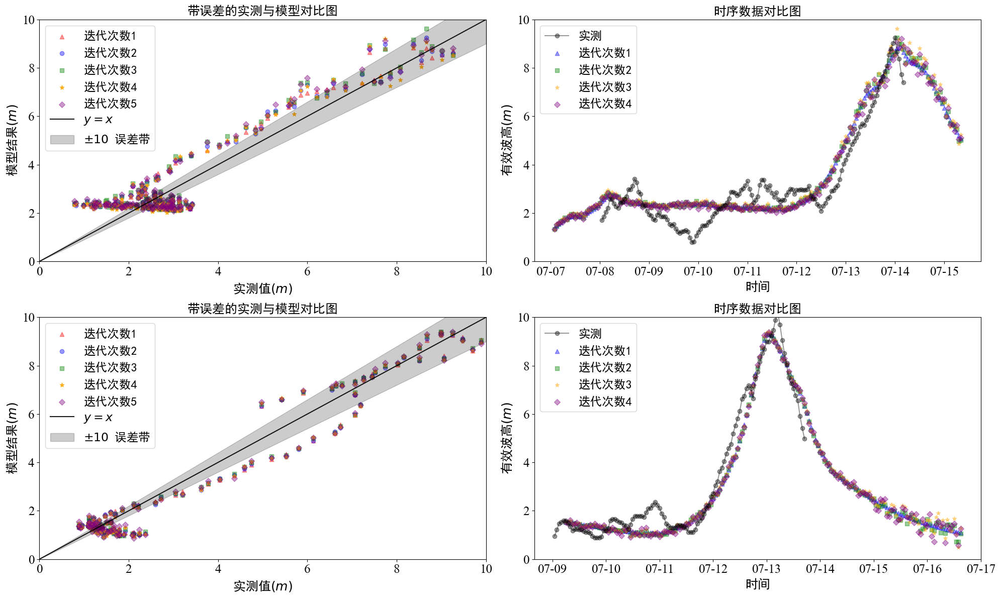

In [59]:
plt.figure(figsize=(20, 12))

plt.subplot(221) 
plt.scatter(matched_hsObserv30, matched_hsExpert30, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv31, matched_hsExpert31, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv32, matched_hsExpert32, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv33, matched_hsExpert33, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv34, matched_hsExpert34, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(222) 

plt.plot(timeObserv3, hsObserv3, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert3[1:], hsExpert13[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert3[1:], hsExpert23[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert3[1:], hsExpert33[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert3[1:], hsExpert43[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

## 灿鸿  舟山


plt.subplot(223) 
plt.scatter(matched_hsObserv40, matched_hsExpert40, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv41, matched_hsExpert41, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv42, matched_hsExpert42, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv43, matched_hsExpert43, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv44, matched_hsExpert44, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

plt.subplot(224) 

plt.plot(timeObserv4, hsObserv4, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert4[1:], hsExpert14[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert4[1:], hsExpert24[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert4[1:], hsExpert34[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert4[1:], hsExpert44[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


plt.tight_layout()
plt.savefig('图片/第四章/计算参数/迭代次数_灿鸿.png',dpi=500)
plt.show()


#### 迭代次数： 利奇马

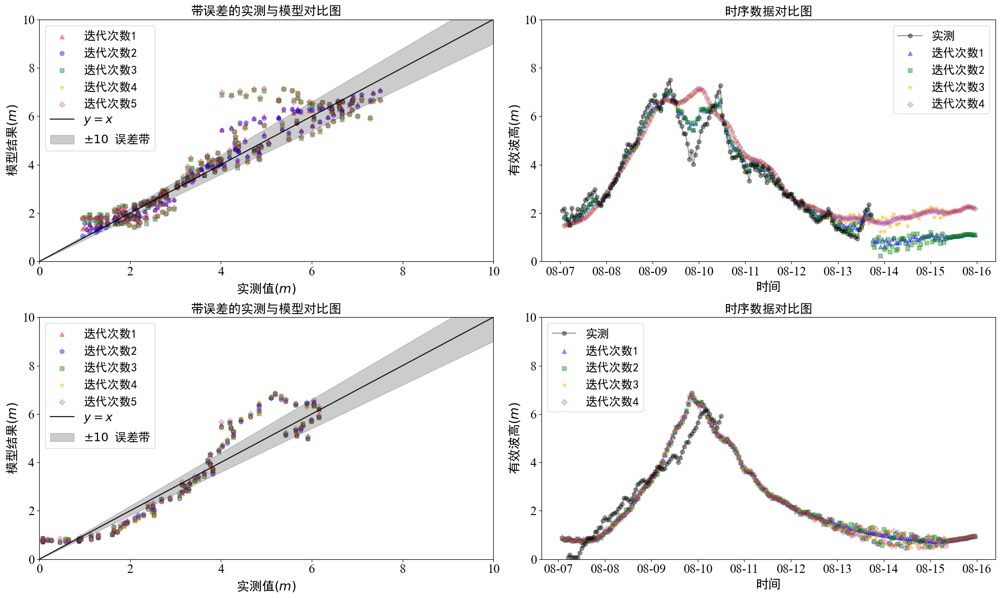

In [60]:
plt.figure(figsize=(20, 12))



plt.subplot(221) 
plt.scatter(matched_hsObserv50, matched_hsExpert50, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv51, matched_hsExpert51, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv52, matched_hsExpert52, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv53, matched_hsExpert53, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv54, matched_hsExpert54, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(222)

plt.plot(timeObserv5, hsObserv5, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert5[1:], hsExpert15[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert5[1:], hsExpert25[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert5[1:], hsExpert35[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert5[1:], hsExpert45[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper right')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


## 利奇马  舟山

plt.subplot(223) 
plt.scatter(matched_hsObserv60, matched_hsExpert60, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv61, matched_hsExpert61, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv62, matched_hsExpert62, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv63, matched_hsExpert63, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv64, matched_hsExpert64, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(224) 

plt.plot(timeObserv6, hsObserv6, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert6[1:], hsExpert16[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert6[1:], hsExpert26[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert6[1:], hsExpert36[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert6[1:], hsExpert46[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)




plt.tight_layout()
plt.savefig('图片/第四章/计算参数/迭代次数_利奇马.png',dpi=500)
plt.show()

### 时间步长


#### 烟花——台州

In [5]:
data = pd.read_csv("dataFinal/Forth/计算时间步长/data.csv",skiprows=1)

In [ ]:
data

In [7]:
data['时间1'] = pd.to_datetime(data['时间1'], format='%Y/%m/%d %H:%M')
data['时间2'] = pd.to_datetime(data['时间2'], format='%Y/%m/%d %H:%M')

In [9]:
timeObserv = data['时间1'][:160]
hsObserv = data['实测'][:160]

timeExpert= data['时间2']
hsExpert1 = data['Time10']
hsExpert2 = data['Time15']
hsExpert3 = data['Time20']
hsExpert4 = data['Time25']
hsExpert5 = data['Time30']

In [10]:
matched_time00, matched_hsObserv00, matched_hsExpert00 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert1)
matched_time01, matched_hsObserv01, matched_hsExpert01 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert2)
matched_time02, matched_hsObserv02, matched_hsExpert02 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert3)
matched_time03, matched_hsObserv03, matched_hsExpert03 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert4)
matched_time04, matched_hsObserv04, matched_hsExpert04 = dataMatch(timeObserv, hsObserv, timeExpert, hsExpert5)



In [11]:
rmse00 = rmseFunction(matched_hsObserv00,matched_hsExpert00)
rmse01 = rmseFunction(matched_hsObserv01,matched_hsExpert01)
rmse02 = rmseFunction(matched_hsObserv02,matched_hsExpert02)
rmse03 = rmseFunction(matched_hsObserv03,matched_hsExpert03)
rmse04 = rmseFunction(matched_hsObserv04,matched_hsExpert04)

r200 = r2Function(matched_hsObserv00,matched_hsExpert00)
r201 = r2Function(matched_hsObserv01,matched_hsExpert01)
r202 = r2Function(matched_hsObserv02,matched_hsExpert02)
r203 = r2Function(matched_hsObserv03,matched_hsExpert03)
r204 = r2Function(matched_hsObserv04,matched_hsExpert04)

mae00 = maeFunction(matched_hsObserv00,matched_hsExpert00)
mae01 = maeFunction(matched_hsObserv01,matched_hsExpert01)
mae02 = maeFunction(matched_hsObserv02,matched_hsExpert02)
mae03 = maeFunction(matched_hsObserv03,matched_hsExpert03)
mae04 = maeFunction(matched_hsObserv04,matched_hsExpert04)

bias00 = biasFunction(matched_hsObserv00,matched_hsExpert00)
bias01 = biasFunction(matched_hsObserv01,matched_hsExpert01)
bias02 = biasFunction(matched_hsObserv02,matched_hsExpert02)
bias03 = biasFunction(matched_hsObserv03,matched_hsExpert03)
bias04 = biasFunction(matched_hsObserv04,matched_hsExpert04)


print(rmse00,rmse01,rmse02,rmse03,rmse04)
print(r200,r201,r202,r203,r204)
print(mae00,mae01,mae02,mae03,mae04)
print(bias00,bias01,bias02,bias03,bias04)

0.6046067507545791 0.6296154977362257 0.6781563426787195 0.643443564874178 0.6202038219195959
0.9073730394651931 0.9027173979111759 0.890753616254726 0.893070342298999 0.9005774908174697
0.4677677634615384 0.48617132319230777 0.5224379428269231 0.4999096294807693 0.4839694060576923
0.08632277564102565 0.1383297397948718 0.19033670390384616 0.03449427007051284 -0.01751269408333332


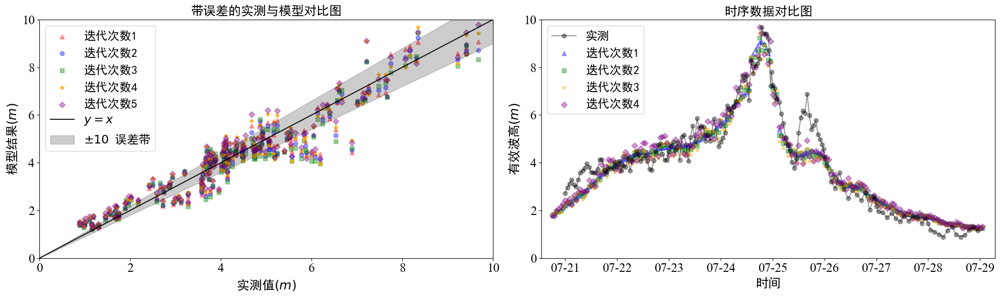

In [14]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv00, matched_hsExpert00, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv01, matched_hsExpert01, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv02, matched_hsExpert02, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv03, matched_hsExpert03, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv04, matched_hsExpert04, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv, hsObserv, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert[130:330], hsExpert1[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert[130:330], hsExpert2[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert[130:330], hsExpert3[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert[130:330], hsExpert4[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert[125],timeExpert[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/烟花_台州.png',dpi=500)
plt.show()

#### 烟花--舟山

In [19]:
data2 = pd.read_csv("dataFinal/Forth/计算时间步长/data2.csv",skiprows=1)

data2['时间1'] = pd.to_datetime(data2['时间1'], format='%Y/%m/%d %H:%M')
data2['时间2'] = pd.to_datetime(data2['时间2'], format='%Y/%m/%d %H:%M')

data2

,时间1,实测,时间2,Time10,Time15,Time20,Time25,Time30
0,2021-07-21 00:00:00,3.29643,2021-07-15 08:00:00,0.02967,0.030244,0.031391,0.028809,0.030244
1,2021-07-21 01:00:00,3.01964,2021-07-15 09:00:00,0.06241,0.060383,0.056330,0.065450,0.060383
2,2021-07-21 02:00:00,3.44618,2021-07-15 10:00:00,0.09555,0.093838,0.090413,0.098119,0.093838
3,2021-07-21 03:00:00,3.04686,2021-07-15 11:00:00,0.12248,0.121194,0.118622,0.124409,0.121194
4,2021-07-21 04:00:00,3.26921,2021-07-15 12:00:00,0.14412,0.143103,0.141070,0.145645,0.143103
...,...,...,...,...,...,...,...,...
403,NaT,NaN,2021-08-01 03:00:00,0.86947,0.890648,0.933004,0.837703,0.890648
404,NaT,NaN,2021-08-01 04:00:00,0.86108,0.827215,0.759486,0.911877,0.827215
405,NaT,NaN,2021-08-01 05:00:00,0.85552,0.816118,0.737314,0.914623,0.816118
406,NaT,NaN,2021-08-01 06:00:00,0.85431,0.845741,0.828602,0.867164,0.845741


In [20]:
timeObserv2 = data2['时间1'][:172]
hsObserv2 = data2['实测'][:172]

timeExpert2= data2['时间2']
hsExpert12 = data2['Time10']
hsExpert22 = data2['Time15']
hsExpert32 = data2['Time20']
hsExpert42 = data2['Time25']
hsExpert52 = data2['Time30']

In [21]:
matched_time10, matched_hsObserv10, matched_hsExpert10 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert12)
matched_time11, matched_hsObserv11, matched_hsExpert11 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert22)
matched_time12, matched_hsObserv12, matched_hsExpert12 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert32)
matched_time13, matched_hsObserv13, matched_hsExpert13 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert42)
matched_time14, matched_hsObserv14, matched_hsExpert14 = dataMatch(timeObserv2, hsObserv2, timeExpert2, hsExpert52)

In [22]:
rmse10 = rmseFunction(matched_hsObserv10,matched_hsExpert10)
rmse11 = rmseFunction(matched_hsObserv11,matched_hsExpert11)
rmse12 = rmseFunction(matched_hsObserv12,matched_hsExpert12)
rmse13 = rmseFunction(matched_hsObserv13,matched_hsExpert13)
rmse14 = rmseFunction(matched_hsObserv14,matched_hsExpert14)

r210 = r2Function(matched_hsObserv10,matched_hsExpert10)
r211 = r2Function(matched_hsObserv11,matched_hsExpert11)
r212 = r2Function(matched_hsObserv12,matched_hsExpert12)
r213 = r2Function(matched_hsObserv13,matched_hsExpert13)
r214 = r2Function(matched_hsObserv14,matched_hsExpert14)

mae10 = maeFunction(matched_hsObserv10,matched_hsExpert10)
mae11 = maeFunction(matched_hsObserv11,matched_hsExpert11)
mae12 = maeFunction(matched_hsObserv12,matched_hsExpert12)
mae13 = maeFunction(matched_hsObserv13,matched_hsExpert13)
mae14 = maeFunction(matched_hsObserv14,matched_hsExpert14)

bias10 = biasFunction(matched_hsObserv10,matched_hsExpert10)
bias11 = biasFunction(matched_hsObserv11,matched_hsExpert11)
bias12 = biasFunction(matched_hsObserv12,matched_hsExpert12)
bias13 = biasFunction(matched_hsObserv13,matched_hsExpert13)
bias14 = biasFunction(matched_hsObserv14,matched_hsExpert14)

print(rmse10,rmse11,rmse12,rmse13,rmse14)
print(r210,r211,r212,r213,r214)
print(mae10,mae11,mae12,mae13,mae14)
print(bias10,bias11,bias12,bias13,bias14)

0.504880389198858 0.502291854906714 0.5555836887137828 0.5452603157099404 0.502291854906714
0.9050980373774898 0.9019886414284254 0.8767136168303705 0.8983796110140059 0.9019886414284254
0.3840965060240964 0.37215185476506024 0.4002192563012048 0.42148920562650605 0.37215185476506024
-0.11255650602409636 -0.07581559888554218 -0.002333784590361415 -0.16766786672289155 -0.07581559888554218


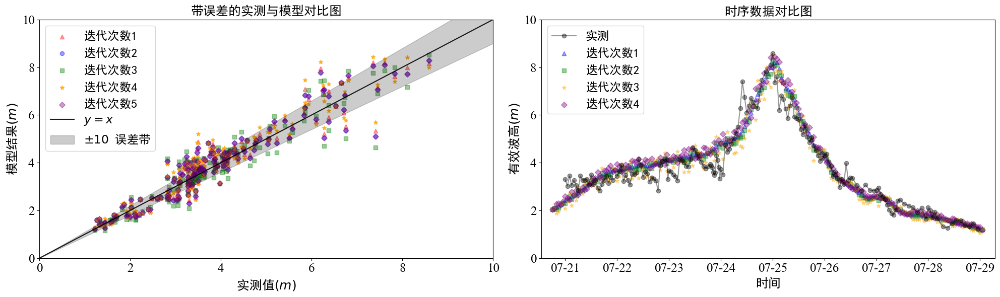

In [23]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv10, matched_hsExpert10, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv11, matched_hsExpert11, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv12, matched_hsExpert12, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv13, matched_hsExpert13, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv14, matched_hsExpert14, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)



plt.subplot(122) 
timeObserv2
plt.plot(timeObserv2, hsObserv2, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert2[130:330], hsExpert12[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert2[130:330], hsExpert22[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert2[130:330], hsExpert32[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert2[130:330], hsExpert42[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert2[125],timeExpert2[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/烟花_舟山.png',dpi=500)
plt.show()

#### 灿鸿——温州

In [25]:
data3 = pd.read_csv("dataFinal/Forth/计算时间步长/data3.csv",skiprows=1)

data3['时间1'] = pd.to_datetime(data3['时间1'], format='%Y/%m/%d %H:%M')
data3['时间2'] = pd.to_datetime(data3['时间2'], format='%Y/%m/%d %H:%M')

timeObserv3 = data3['时间1'][:148]
hsObserv3 = data3['实测'][:148]

timeExpert3= data3['时间2'][:200]
hsExpert13 = data3['Time10'][:200]
hsExpert23 = data3['Time15'][:200]
hsExpert33 = data3['Time20'][:200]
hsExpert43 = data3['Time25'][:200]
hsExpert53 = data3['Time30'][:200]

In [26]:
matched_time30, matched_hsObserv30, matched_hsExpert30 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert13)
matched_time31, matched_hsObserv31, matched_hsExpert31 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert23)
matched_time32, matched_hsObserv32, matched_hsExpert32 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert33)
matched_time33, matched_hsObserv33, matched_hsExpert33 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert43)
matched_time34, matched_hsObserv34, matched_hsExpert34 = dataMatch(timeObserv3, hsObserv3, timeExpert3, hsExpert53)


rmse30 = rmseFunction(matched_hsObserv30,matched_hsExpert30)
rmse31 = rmseFunction(matched_hsObserv31,matched_hsExpert31)
rmse32 = rmseFunction(matched_hsObserv32,matched_hsExpert32)
rmse33 = rmseFunction(matched_hsObserv33,matched_hsExpert33)
rmse34 = rmseFunction(matched_hsObserv34,matched_hsExpert34)

r230 = r2Function(matched_hsObserv30,matched_hsExpert30)
r231 = r2Function(matched_hsObserv31,matched_hsExpert31)
r232 = r2Function(matched_hsObserv32,matched_hsExpert32)
r233 = r2Function(matched_hsObserv33,matched_hsExpert33)
r234 = r2Function(matched_hsObserv34,matched_hsExpert34)

mae30 = maeFunction(matched_hsObserv30,matched_hsExpert30)
mae31 = maeFunction(matched_hsObserv31,matched_hsExpert31)
mae32 = maeFunction(matched_hsObserv32,matched_hsExpert32)
mae33 = maeFunction(matched_hsObserv33,matched_hsExpert33)
mae34 = maeFunction(matched_hsObserv34,matched_hsExpert34)


bias30 = biasFunction(matched_hsObserv30,matched_hsExpert30)
bias31 = biasFunction(matched_hsObserv31,matched_hsExpert31)
bias32 = biasFunction(matched_hsObserv32,matched_hsExpert32)
bias33 = biasFunction(matched_hsObserv33,matched_hsExpert33)
bias34 = biasFunction(matched_hsObserv34,matched_hsExpert34)

print(rmse30,rmse31,rmse32,rmse33,rmse34)
print(r230,r231,r232,r233,r234)
print(mae30,mae31,mae32,mae33,mae34)
print(bias30,bias31,bias32,bias33,bias34)



0.7240323804352606 0.7240323804352606 0.7573729068257989 0.7103403929239952 0.7536051507530473
0.8783004389477869 0.8783004389477869 0.8745129445208587 0.8773257292095313 0.8750543359610243
0.6355765878378379 0.6355765878378379 0.6621147487567567 0.6216665416351351 0.6590667279594594
-0.20820983108108113 -0.20820983108108113 -0.25476795020270276 -0.16588426820270277 -0.2505353939594595


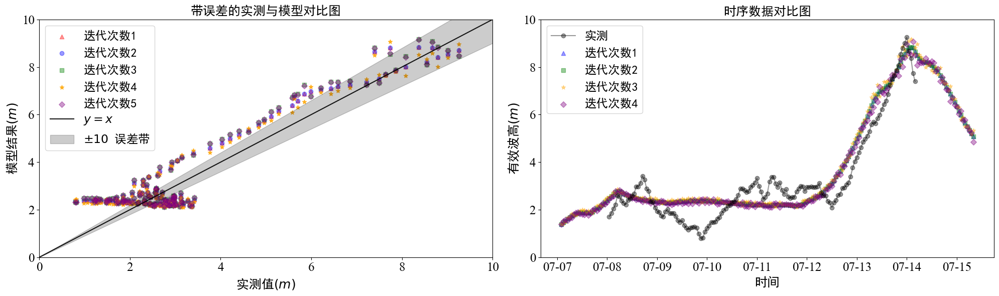

In [27]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv30, matched_hsExpert30, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv31, matched_hsExpert31, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv32, matched_hsExpert32, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv33, matched_hsExpert33, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv34, matched_hsExpert34, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv3, hsObserv3, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert3[1:], hsExpert13[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert3[1:], hsExpert23[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert3[1:], hsExpert33[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert3[1:], hsExpert43[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/灿鸿_温州.png',dpi=500)
plt.show()

#### 灿鸿——舟山

In [28]:
data4 = pd.read_csv("dataFinal/Forth/计算时间步长/data4.csv",skiprows=1)

data4['时间1'] = pd.to_datetime(data4['时间1'], format='%Y/%m/%d %H:%M')
data4['时间2'] = pd.to_datetime(data4['时间2'], format='%Y/%m/%d %H:%M')

timeObserv4 = data4['时间1'][:113]
hsObserv4 = data4['实测'][:113]

timeExpert4= data4['时间2'][:179]
hsExpert14 = data4['Time10'][:179]
hsExpert24 = data4['Time15'][:179]
hsExpert34 = data4['Time20'][:179]
hsExpert44 = data4['Time25'][:179]
hsExpert54 = data4['Time30'][:179]

In [29]:
matched_time40, matched_hsObserv40, matched_hsExpert40 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert14)
matched_time41, matched_hsObserv41, matched_hsExpert41 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert24)
matched_time42, matched_hsObserv42, matched_hsExpert42 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert34)
matched_time43, matched_hsObserv43, matched_hsExpert43 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert44)
matched_time44, matched_hsObserv44, matched_hsExpert44 = dataMatch(timeObserv4, hsObserv4, timeExpert4, hsExpert54)


rmse40 = rmseFunction(matched_hsObserv40,matched_hsExpert40)
rmse41 = rmseFunction(matched_hsObserv41,matched_hsExpert41)
rmse42 = rmseFunction(matched_hsObserv42,matched_hsExpert42)
rmse43 = rmseFunction(matched_hsObserv43,matched_hsExpert43)
rmse44 = rmseFunction(matched_hsObserv44,matched_hsExpert44)

r240 = r2Function(matched_hsObserv40,matched_hsExpert40)
r241 = r2Function(matched_hsObserv41,matched_hsExpert41)
r242 = r2Function(matched_hsObserv42,matched_hsExpert42)
r243 = r2Function(matched_hsObserv43,matched_hsExpert43)
r244 = r2Function(matched_hsObserv44,matched_hsExpert44)

mae40 = maeFunction(matched_hsObserv40,matched_hsExpert40)
mae41 = maeFunction(matched_hsObserv41,matched_hsExpert41)
mae42 = maeFunction(matched_hsObserv42,matched_hsExpert42)
mae43 = maeFunction(matched_hsObserv43,matched_hsExpert43)
mae44 = maeFunction(matched_hsObserv44,matched_hsExpert44)

bias40 = biasFunction(matched_hsObserv40,matched_hsExpert40)
bias41 = biasFunction(matched_hsObserv41,matched_hsExpert41)
bias42 = biasFunction(matched_hsObserv42,matched_hsExpert42)
bias43 = biasFunction(matched_hsObserv43,matched_hsExpert43)
bias44 = biasFunction(matched_hsObserv44,matched_hsExpert44)



print(rmse40,rmse41,rmse42,rmse43,rmse44)
print(r240,r241,r242,r243,r244)
print(mae40,mae41,mae42,mae43,mae44)
print(bias40,bias41,bias42,bias43,bias44)

0.614144255919486 0.6186683576021875 0.6226829060882982 0.6359765014523687 0.616795191966036
0.9580090773794291 0.9578537267016207 0.9562556943292271 0.9558182451220514 0.9573718935648706
0.48855357798165155 0.4925875514770642 0.49623733065137604 0.5068454130183486 0.49215490566055053
0.18986568807339443 0.19923238833944956 0.18049898780733944 0.20859908861467882 0.18518233793577976


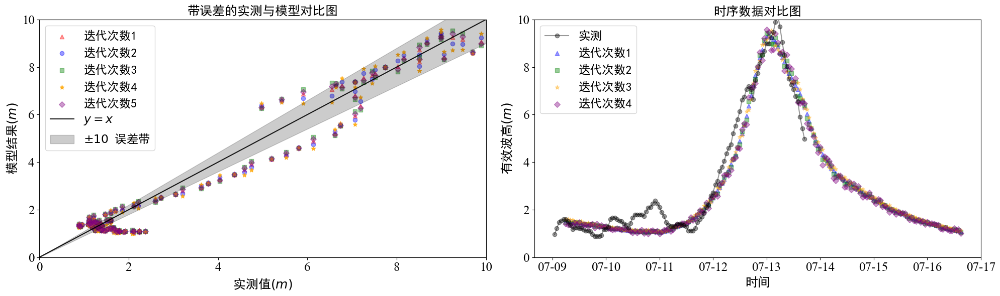

In [30]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv40, matched_hsExpert40, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv41, matched_hsExpert41, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv42, matched_hsExpert42, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv43, matched_hsExpert43, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv44, matched_hsExpert44, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

plt.subplot(122) 

plt.plot(timeObserv4, hsObserv4, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert4[1:], hsExpert14[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert4[1:], hsExpert24[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert4[1:], hsExpert34[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert4[1:], hsExpert44[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/灿鸿_舟山.png',dpi=500)
plt.show()

#### 利奇马——温州


In [31]:
data5 = pd.read_csv("dataFinal/Forth/计算时间步长/data5.csv",skiprows=1)

data5['时间1'] = pd.to_datetime(data5['时间1'], format='%Y/%m/%d %H:%M')
data5['时间2'] = pd.to_datetime(data5['时间2'], format='%Y/%m/%d %H:%M')

timeObserv5 = data5['时间1'][:161]
hsObserv5 = data5['实测'][:161]

timeExpert5= data5['时间2'][:215]
hsExpert15 = data5['Time10'][:215]
hsExpert25 = data5['Time15'][:215]
hsExpert35 = data5['Time20'][:215]
hsExpert45 = data5['Time25'][:215]
hsExpert55 = data5['Time30'][:215]

In [32]:
matched_time50, matched_hsObserv50, matched_hsExpert50 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert15)
matched_time51, matched_hsObserv51, matched_hsExpert51 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert25)
matched_time52, matched_hsObserv52, matched_hsExpert52 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert35)
matched_time53, matched_hsObserv53, matched_hsExpert53 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert45)
matched_time54, matched_hsObserv54, matched_hsExpert54 = dataMatch(timeObserv5, hsObserv5, timeExpert5, hsExpert55)



rmse50 = rmseFunction(matched_hsObserv50,matched_hsExpert50)
rmse51 = rmseFunction(matched_hsObserv51,matched_hsExpert51)
rmse52 = rmseFunction(matched_hsObserv52,matched_hsExpert52)
rmse53 = rmseFunction(matched_hsObserv53,matched_hsExpert53)
rmse54 = rmseFunction(matched_hsObserv54,matched_hsExpert54)

r250 = r2Function(matched_hsObserv50,matched_hsExpert50)
r251 = r2Function(matched_hsObserv51,matched_hsExpert51)
r252 = r2Function(matched_hsObserv52,matched_hsExpert52)
r253 = r2Function(matched_hsObserv53,matched_hsExpert53)
r254 = r2Function(matched_hsObserv54,matched_hsExpert54)

mae50 = maeFunction(matched_hsObserv50,matched_hsExpert50)
mae51 = maeFunction(matched_hsObserv51,matched_hsExpert51)
mae52 = maeFunction(matched_hsObserv52,matched_hsExpert52)
mae53 = maeFunction(matched_hsObserv53,matched_hsExpert53)
mae54 = maeFunction(matched_hsObserv54,matched_hsExpert54)

bias50 = biasFunction(matched_hsObserv50,matched_hsExpert50)
bias51 = biasFunction(matched_hsObserv51,matched_hsExpert51)
bias52 = biasFunction(matched_hsObserv52,matched_hsExpert52)
bias53 = biasFunction(matched_hsObserv53,matched_hsExpert53)
bias54 = biasFunction(matched_hsObserv54,matched_hsExpert54)


print(rmse50,rmse51,rmse52,rmse53,rmse54)
print(r250,r251,r252,r253,r254)
print(mae50,mae51,mae52,mae53,mae54)
print(bias50,bias51,bias52,bias53,bias54)


0.3684638895589606 0.36331782496359893 0.42765621521055885 0.3684638895589606 0.4669401438316701
0.9605427256223448 0.9593362095790553 0.9532959302952554 0.9605427256223448 0.9473966600816699
0.2616903934968944 0.262652702378882 0.30273992691925466 0.2616903934968944 0.3379540965093167
-0.0850163802795031 -0.03828096839130434 -0.15044595688198759 -0.0850163802795031 -0.17848720395031054


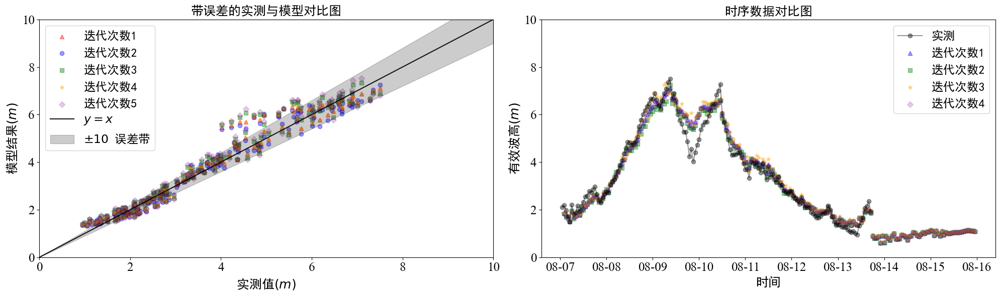

In [33]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv50, matched_hsExpert50, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv51, matched_hsExpert51, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv52, matched_hsExpert52, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv53, matched_hsExpert53, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv54, matched_hsExpert54, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv5, hsObserv5, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert5[1:], hsExpert15[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert5[1:], hsExpert25[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert5[1:], hsExpert35[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert5[1:], hsExpert45[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper right')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/利奇马_温州.png',dpi=500)
plt.show()



#### 利奇马——舟山

In [34]:
data6 = pd.read_csv("dataFinal/Forth/计算时间步长/data6.csv",skiprows=1)

data6['时间1'] = pd.to_datetime(data6['时间1'], format='%Y/%m/%d %H:%M')
data6['时间2'] = pd.to_datetime(data6['时间2'], format='%Y/%m/%d %H:%M')


timeObserv6 = data6['时间1'][:80]
hsObserv6 = data6['实测'][:80]

timeExpert6= data6['时间2'][:215]
hsExpert16 = data6['Time10'][:215]
hsExpert26 = data6['Time15'][:215]
hsExpert36 = data6['Time20'][:215]
hsExpert46 = data6['Time25'][:215]
hsExpert56 = data6['Time30'][:215]

In [35]:
matched_time60, matched_hsObserv60, matched_hsExpert60 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert16)
matched_time61, matched_hsObserv61, matched_hsExpert61 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert26)
matched_time62, matched_hsObserv62, matched_hsExpert62 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert36)
matched_time63, matched_hsObserv63, matched_hsExpert63 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert46)
matched_time64, matched_hsObserv64, matched_hsExpert64 = dataMatch(timeObserv6, hsObserv6, timeExpert6, hsExpert56)



rmse60 = rmseFunction(matched_hsObserv60,matched_hsExpert60)
rmse61 = rmseFunction(matched_hsObserv61,matched_hsExpert61)
rmse62 = rmseFunction(matched_hsObserv62,matched_hsExpert62)
rmse63 = rmseFunction(matched_hsObserv63,matched_hsExpert63)
rmse64 = rmseFunction(matched_hsObserv64,matched_hsExpert64)

r260 = r2Function(matched_hsObserv60,matched_hsExpert60)
r261 = r2Function(matched_hsObserv61,matched_hsExpert61)
r262 = r2Function(matched_hsObserv62,matched_hsExpert62)
r263 = r2Function(matched_hsObserv63,matched_hsExpert63)
r264 = r2Function(matched_hsObserv64,matched_hsExpert64)

mae60 = maeFunction(matched_hsObserv60,matched_hsExpert60)
mae61 = maeFunction(matched_hsObserv61,matched_hsExpert61)
mae62 = maeFunction(matched_hsObserv62,matched_hsExpert62)
mae63 = maeFunction(matched_hsObserv63,matched_hsExpert63)
mae64 = maeFunction(matched_hsObserv64,matched_hsExpert64)

bias60 = biasFunction(matched_hsObserv60,matched_hsExpert60)
bias61 = biasFunction(matched_hsObserv61,matched_hsExpert61)
bias62 = biasFunction(matched_hsObserv62,matched_hsExpert62)
bias63 = biasFunction(matched_hsObserv63,matched_hsExpert63)
bias64 = biasFunction(matched_hsObserv64,matched_hsExpert64)

print(rmse60,rmse61,rmse62,rmse63,rmse64)
print(r260,r261,r262,r263,r264)
print(mae60,mae61,mae62,mae63,mae64)
print(bias60,bias61,bias62,bias63,bias64)


0.6745087869535134 0.6573887188070039 0.6663366147427089 0.7196547063138908 0.6700183825291285
0.9077480683853928 0.9083760296235505 0.9071817731256141 0.9014290841659747 0.9081416821853912
0.5314755000000001 0.5247566432124999 0.5332353210625 0.5569208703374999 0.5292262979875
-0.17115975 -0.1424053588375 -0.14316983561250002 -0.21141589761250007 -0.16540887181250002


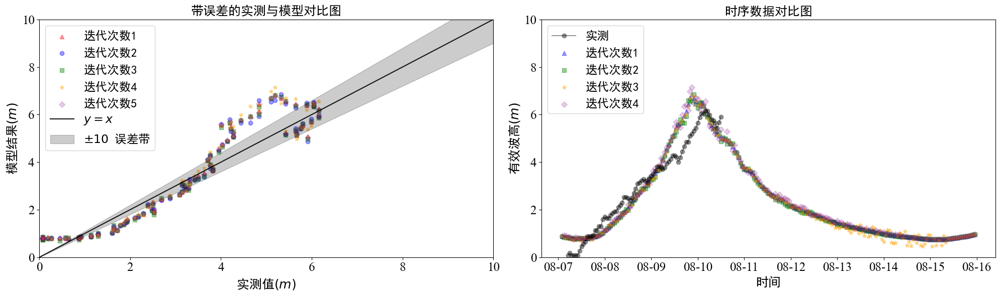

In [36]:
plt.figure(figsize=(20, 6))

plt.subplot(121) 
plt.scatter(matched_hsObserv60, matched_hsExpert60, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv61, matched_hsExpert61, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv62, matched_hsExpert62, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv63, matched_hsExpert63, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv64, matched_hsExpert64, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(122) 

plt.plot(timeObserv6, hsObserv6, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert6[1:], hsExpert16[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert6[1:], hsExpert26[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert6[1:], hsExpert36[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert6[1:], hsExpert46[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/利奇马_舟山.png',dpi=500)
plt.show()


#### RMSE 矩阵

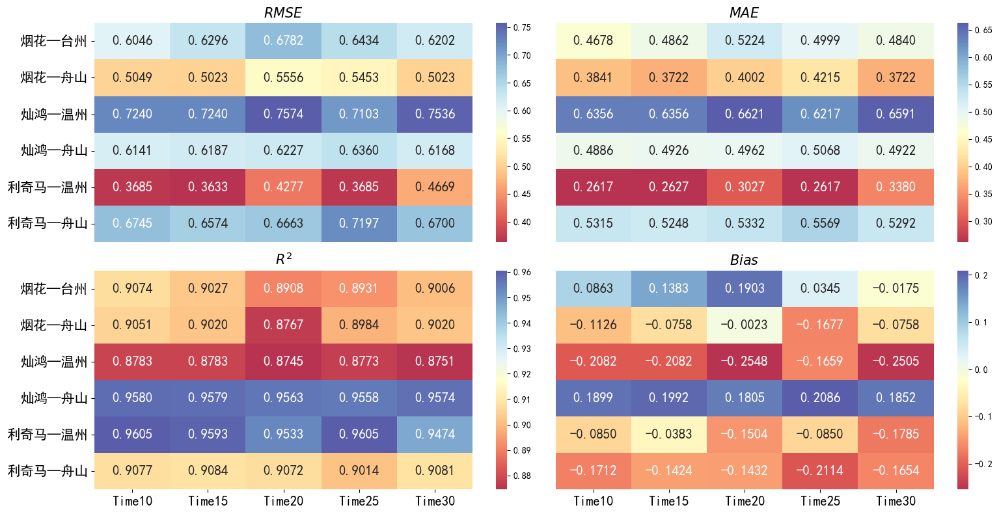

In [39]:
import seaborn as sns

rmse_iter = np.array([[rmse00,rmse10,rmse30,rmse40,rmse50,rmse60],
                     [rmse01,rmse11,rmse31,rmse41,rmse51,rmse61],
                     [rmse02,rmse12,rmse32,rmse42,rmse52,rmse62],
                     [rmse03,rmse13,rmse33,rmse43,rmse53,rmse63],
                     [rmse04,rmse14,rmse34,rmse44,rmse54,rmse64]]).T

mae_iter = np.array([[mae00,mae10,mae30,mae40,mae50,mae60],
                     [mae01,mae11,mae31,mae41,mae51,mae61],
                     [mae02,mae12,mae32,mae42,mae52,mae62],
                     [mae03,mae13,mae33,mae43,mae53,mae63],
                     [mae04,mae14,mae34,mae44,mae54,mae64]]).T

r2_iter = np.array([[r200,r210,r230,r240,r250,r260],
                     [r201,r211,r231,r241,r251,r261],
                     [r202,r212,r232,r242,r252,r262],
                     [r203,r213,r233,r243,r253,r263],
                     [r204,r214,r234,r244,r254,r264]]).T

bias_iter = np.array([[bias00,bias10,bias30,bias40,bias50,bias60],
                        [bias01,bias11,bias31,bias41,bias51,bias61],
                        [bias02,bias12,bias32,bias42,bias52,bias62],
                        [bias03,bias13,bias33,bias43,bias53,bias63],
                        [bias04,bias14,bias34,bias44,bias54,bias64]]).T


annot_font = {'size': 15}

plt.figure(figsize=(16, 8))


plt.subplot(221)
sns.heatmap(rmse_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'],
            xticklabels=['Time10', 'Time15', 'Time20', 'Time25', 'Time30'])



plt.yticks(fontsize=15)  
plt.xticks([],fontsize=15)


plt.title('$RMSE$',size=15)


plt.subplot(222)
sns.heatmap(mae_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'],
            xticklabels=['Time10', 'Time15', 'Time20', 'Time25', 'Time30'])
plt.yticks([],fontsize=15)  
plt.xticks([],fontsize=15)
plt.title('$MAE$',size=15)


plt.subplot(223)
sns.heatmap(r2_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'], 
            xticklabels=['Time10', 'Time15', 'Time20', 'Time25', 'Time30'])

plt.yticks(fontsize=15)  
plt.xticks(fontsize=15)

plt.title('$R^2$',size=15)

plt.subplot(224)
sns.heatmap(bias_iter, annot=True, cmap="RdYlBu", alpha= 0.8, fmt=".4f", annot_kws=annot_font,
            yticklabels=['烟花—台州', '烟花—舟山', '灿鸿—温州', '灿鸿—舟山', '利奇马—温州', '利奇马—舟山'], 
            xticklabels=['Time10', 'Time15', 'Time20', 'Time25', 'Time30'])
plt.yticks([],fontsize=15)  
plt.xticks(fontsize=15)
plt.title('$Bias$',size=15)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/迭代次数的指标.png',dpi=500)
plt.show()


#### 计算时间——烟花

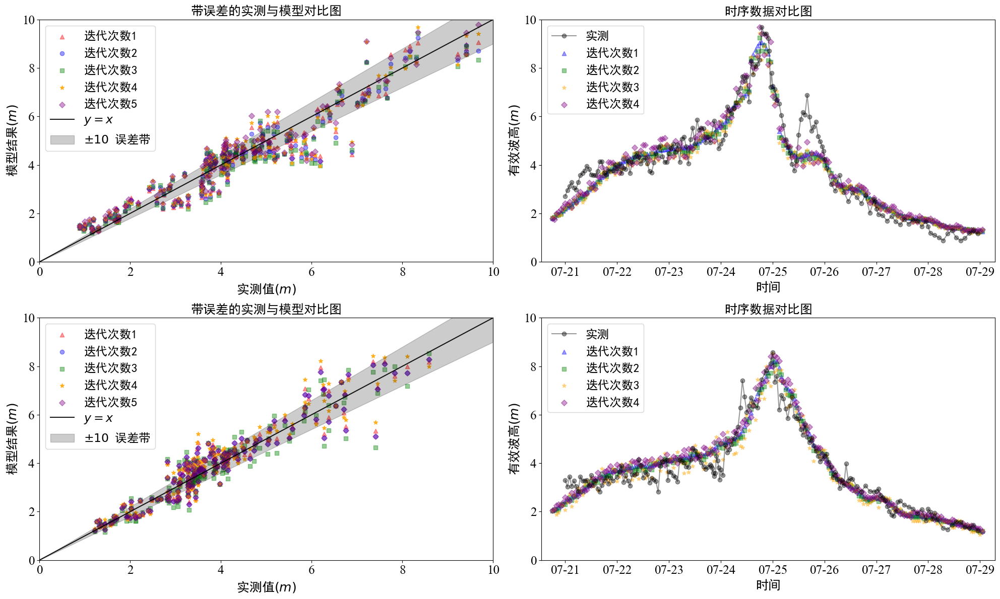

In [42]:
plt.figure(figsize=(20, 12))


plt.subplot(221) 
plt.scatter(matched_hsObserv00, matched_hsExpert00, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv01, matched_hsExpert01, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv02, matched_hsExpert02, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv03, matched_hsExpert03, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv04, matched_hsExpert04, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(222) 

plt.plot(timeObserv, hsObserv, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert[130:330], hsExpert1[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert[130:330], hsExpert2[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert[130:330], hsExpert3[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert[130:330], hsExpert4[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert[125],timeExpert[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)



plt.subplot(223) 
plt.scatter(matched_hsObserv10, matched_hsExpert10, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv11, matched_hsExpert11, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv12, matched_hsExpert12, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv13, matched_hsExpert13, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv14, matched_hsExpert14, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)



plt.subplot(224) 
timeObserv2
plt.plot(timeObserv2, hsObserv2, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert2[130:330], hsExpert12[130:330], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert2[130:330], hsExpert22[130:330], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert2[130:330], hsExpert32[130:330], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert2[130:330], hsExpert42[130:330], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

plt.xlim(timeExpert2[125],timeExpert2[335])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

plt.tight_layout()
plt.savefig('图片/第四章/计算参数//计算步长/计算时间_烟花.png',dpi=500)
plt.show()


#### 计算时间——灿鸿

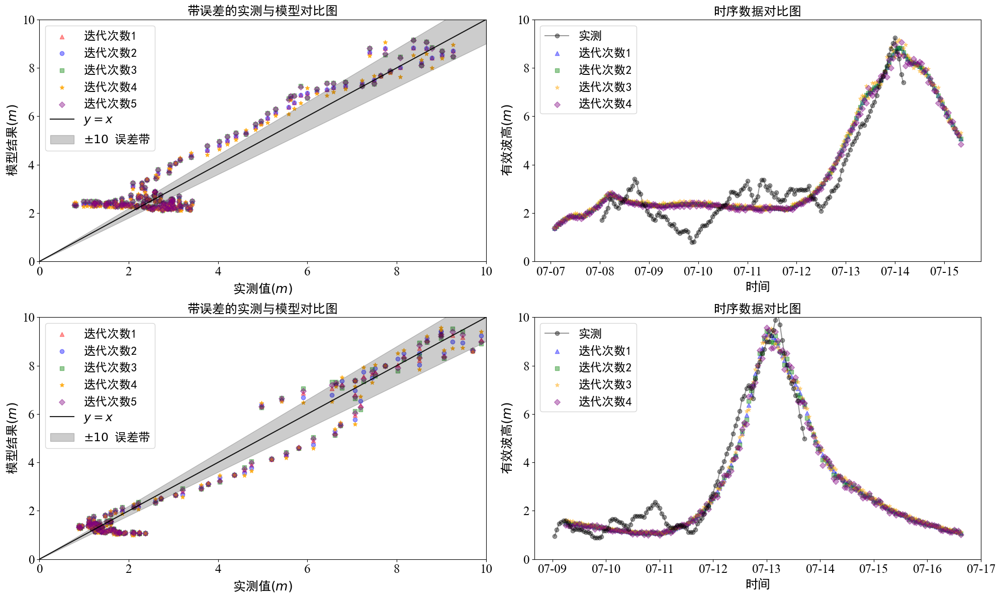

In [44]:
plt.figure(figsize=(20, 12))

plt.subplot(221) 
plt.scatter(matched_hsObserv30, matched_hsExpert30, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv31, matched_hsExpert31, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv32, matched_hsExpert32, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv33, matched_hsExpert33, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv34, matched_hsExpert34, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(222) 

plt.plot(timeObserv3, hsObserv3, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert3[1:], hsExpert13[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert3[1:], hsExpert23[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert3[1:], hsExpert33[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert3[1:], hsExpert43[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)

## 灿鸿  舟山


plt.subplot(223) 
plt.scatter(matched_hsObserv40, matched_hsExpert40, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv41, matched_hsExpert41, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv42, matched_hsExpert42, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv43, matched_hsExpert43, color='orange', marker='*',alpha=0.8, label='迭代次数4')
plt.scatter(matched_hsObserv44, matched_hsExpert44, color='purple', marker='D',alpha=0.4, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

plt.subplot(224) 

plt.plot(timeObserv4, hsObserv4, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert4[1:], hsExpert14[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert4[1:], hsExpert24[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert4[1:], hsExpert34[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert4[1:], hsExpert44[1:], color='purple', marker='D',alpha=0.4, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/计算时间_灿鸿.png',dpi=500)
plt.show()


#### 计算时间————利奇马

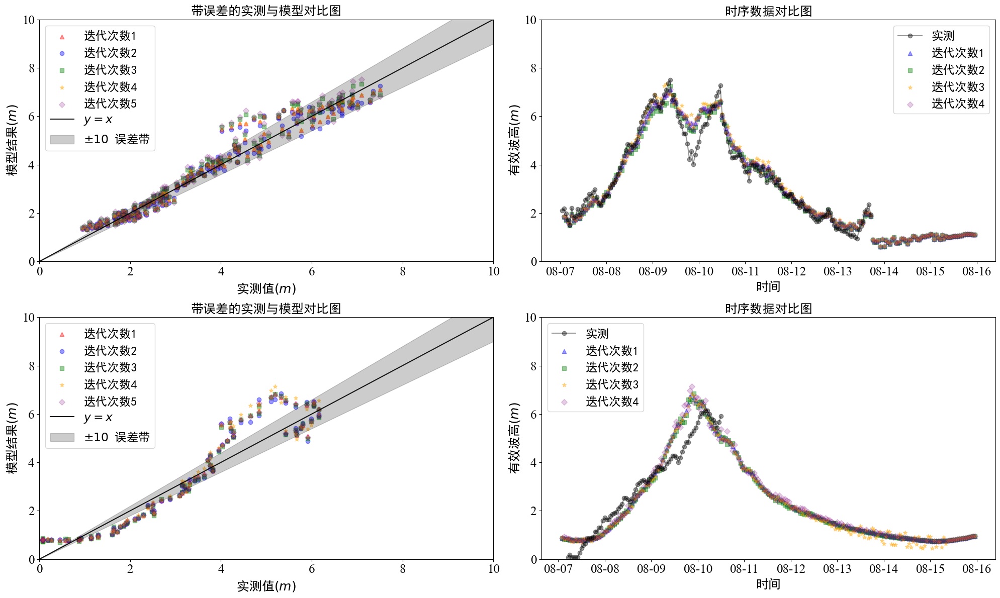

In [43]:
plt.figure(figsize=(20, 12))



plt.subplot(221) 
plt.scatter(matched_hsObserv50, matched_hsExpert50, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv51, matched_hsExpert51, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv52, matched_hsExpert52, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv53, matched_hsExpert53, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv54, matched_hsExpert54, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(222)

plt.plot(timeObserv5, hsObserv5, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert5[1:], hsExpert15[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert5[1:], hsExpert25[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert5[1:], hsExpert35[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert5[1:], hsExpert45[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper right')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)


## 利奇马  舟山

plt.subplot(223) 
plt.scatter(matched_hsObserv60, matched_hsExpert60, color='red', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(matched_hsObserv61, matched_hsExpert61, color='blue', marker='o',alpha=0.4, label='迭代次数2')
plt.scatter(matched_hsObserv62, matched_hsExpert62, color='green', marker='s',alpha=0.4, label='迭代次数3')
plt.scatter(matched_hsObserv63, matched_hsExpert63, color='orange', marker='*',alpha=0.4, label='迭代次数4')
plt.scatter(matched_hsObserv64, matched_hsExpert64, color='purple', marker='D',alpha=0.2, label='迭代次数5')
plt.plot(x, y, label='$y = x$',color='k',alpha=0.9)
plt.fill_between(x, y - err, y + err, color = 'k', alpha=0.2,label='$±10%$ 误差带')
                 
plt.legend(fontsize=17,loc='upper left')

plt.xlabel('实测值$(m)$', fontsize=18) 
plt.ylabel('模型结果$(m)$', fontsize=18)
plt.title('带误差的实测与模型对比图', fontsize=18)

plt.xlim(0,10)
plt.ylim(0,10)
plt.xticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)


plt.subplot(224) 

plt.plot(timeObserv6, hsObserv6, color='black', marker='o',alpha=0.4, label='实测')
plt.scatter(timeExpert6[1:], hsExpert16[1:], color='blue', marker='^',alpha=0.4, label='迭代次数1')
plt.scatter(timeExpert6[1:], hsExpert26[1:], color='green', marker='s',alpha=0.4, label='迭代次数2')
plt.scatter(timeExpert6[1:], hsExpert36[1:], color='orange', marker='*',alpha=0.4, label='迭代次数3')
plt.scatter(timeExpert6[1:], hsExpert46[1:], color='purple', marker='D',alpha=0.2, label='迭代次数4')

plt.legend(fontsize=17,loc='upper left')
plt.title('时序数据对比图', fontsize=18)

# plt.xlim(timeExpert3[0],timeExpert3[197])
plt.ylim(0,10)

plt.xticks(fontproperties = 'Times New Roman',size = 18)
plt.yticks(np.arange(0, 11, 2),fontproperties = 'Times New Roman',size = 18)

date_format = DateFormatter('%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.xlabel('时间', fontsize=18) 
plt.ylabel('有效波高$(m)$', fontsize=18)




plt.tight_layout()
plt.savefig('图片/第四章/计算参数/计算步长/计算时间_利奇马.png',dpi=500)
plt.show()